# Análisis de las pruebas realizadas con Blosc 

## Objetivos del análisis
* Relacionar el tamaño de bloque con las medidas de compresión y decompresión.
* Comprobar el comportamiento de los niveles de compresión sobre las pruebas.
* Comparar los datos de compresión de tablas normales y columnares.
* ¿Existe correlación entre blosclz o lz4 con nivel de compresión 1 y el resto de codecs?
* **[Punto muerto]** ¿Existe correlación entre las características del chunk y las medidas de compresión y decompresión?

## Descripción de la muestra

El DataFrame en cuestión está formado por las características extraídas de un array de datos al comprimirlo y descomprimirlo mediante blosc. En cada fichero aparecen distintos conjuntos de datos los cuáles dividimos en fragmentos de 16 MegaBytes y sobre los cuales realizamos las pruebas de compresión y decompresión.  
Cada fila se corresponde con los datos de realizar los test de compresión sobre un fragmento (*chunk*) de datos específico con un tamaño de bloque, codec, filtro y nivel de compresión determinados.

Variable | Descripción
-------------  | -------------
*Filename* | nombre del fichero del que proviene.
*DataSet* | dentro del fichero el conjunto de datos del que proviene.
*Table* | 0 si los datos vienen de un array, 1 si vienen de tablas y 2 para tablas columnares.
*DType* | indica el tipo de los datos.
*Chunk_Number* | número de fragmento dentro del conjunto de datos.
*Chunk_Size* | tamaño del fragmento.
*Mean* | la media.
*Median* | la mediana.
*Sd* | la desviación típica.
*Skew* | el coeficiente de asimetría.
*Kurt* | el coeficiente de apuntamiento.
*Min* | el mínimo absoluto.
*Max* | el máximo absoluto.
*Q1* | el primer cuartil.
*Q3* | el tercer cuartil.
*N_Streaks* | número de rachas seguidas por encima o debajo de la mediana.
*Block_Size* | el tamaño de bloque que utilizará Blosc para comprimir.
*Codec* | el codec de blosc utilizado.
*Filter* | el filtro de blosc utilizado.
*CL* | el nivel de compresión utilizado.
*CRate* | el ratio de compresión obtenido.
*CSpeed* | la velocidad de compresión obtenida en GB/s.
*DSpeed* | la velocidad de decompresión obtenida en GB/s.

In [1]:
%matplotlib inline
%config InlineBackend.figure_format='retina'

%load_ext autoreload
%autoreload 2

%load_ext version_information
%version_information numpy, scipy, matplotlib, pandas

Software versions
Python 3.5.2 64bit [MSC v.1900 64 bit (AMD64)]
IPython 5.3.0
OS Windows 10 10.0.14393 SP0
numpy 1.11.3
scipy 0.19.0
matplotlib 2.0.0
pandas 0.19.2
Mon Apr 03 10:20:07 2017 Hora de verano romance

In [2]:
import os
import sys
sys.path.append("../src/")

from IPython.display import display
import matplotlib
from matplotlib import pyplot as plt
import pandas as pd

import custom_plots as cst

pd.options.display.float_format = '{:,.3f}'.format
matplotlib.rcParams.update({'font.size': 12})

## Descripción general
Cargamos el csv entero, comprobamos que no faltan campos y mostramos un breve resumen.

In [3]:
# LOAD WHOLE CSV
DF = pd.read_csv('../data/blosc_test_data.csv.gz', sep='\t')
# SORT COLUMNS
DF = DF[cst.COLS]
# CHECK MISSING DATA
if not DF.isnull().any().any():
    print('No missing data')
else:
    print("Missing data")

No missing data


In [4]:
# SUMMARY OF THE DATAFRAME 
display(DF[cst.COLS[5:]].describe())

,Chunk_Size,Mean,Median,Sd,Skew,Kurt,Min,Max,Q1,Q3,N_Streaks,Block_Size,CL,CRate,CSpeed,DSpeed
count,"1,038,420.000","1,038,420.000","1,038,420.000","1,038,420.000","1,038,420.000","1,038,420.000","1,038,420.000","1,038,420.000","1,038,420.000","1,038,420.000","1,038,420.000","1,038,420.000","1,038,420.000","1,038,420.000","1,038,420.000","1,038,420.000"
mean,14.905,"105,388.308","78,129.425","99,976.259",13.317,"2,889.591","65,243.409","545,501.677","71,737.862","84,294.961","209,492.168",408.800,5.000,89.698,3.457,6.821
std,3.507,"1,986,645.954","1,963,930.892","995,299.289",40.888,"21,176.379","1,654,195.613","5,154,590.640","1,811,803.139","2,109,316.172","249,852.767",626.196,2.582,643.275,4.301,4.524
min,0.015,-509.377,-999.000,0.000,-0.600,-3.000,-999.000,-4.000,-999.000,-4.000,0.000,0.000,1.000,0.999,0.001,0.179
25%,16.000,0.000,0.000,0.137,0.066,-0.904,-12.842,7.000,0.000,0.000,"18,005.000",16.000,3.000,2.046,0.420,3.227
50%,16.000,0.077,0.000,2.248,3.121,12.392,0.000,31.435,0.000,0.000,"118,220.000",96.000,5.000,5.554,1.830,6.210
75%,16.000,1.976,0.000,13.718,9.899,175.292,0.000,85.000,0.000,18.565,"291,171.000",512.000,7.000,19.355,4.766,9.432
max,16.000,"49,778,180.925","49,760,930.000","14,745,014.725",497.825,"316,831.759","41,913,429.000","64,103,344.000","45,906,809.000","53,443,823.000","1,116,373.000","2,048.000",9.000,"10,645.442",23.848,86.345


Filtramos el csv para eliminar ficheros que utilizan técnicas de compresión con pérdidas.

In [5]:
my_df = DF[(DF.Filename != 'WRF_India-LSD1.h5') & (DF.Filename != 'WRF_India-LSD2.h5') & (DF.Filename != 'WRF_India-LSD3.h5')]

Veamos cuantos conjuntos de datos tiene el fichero.

In [6]:
sets = my_df.drop_duplicates(subset=['DataSet', 'Table'])[cst.DESC_SET]
display(sets)
print('There are %d datasets' % (sets.shape[0]))

,DataSet,DType,Table,Chunk_Size
0,/U,float32,0.000,16.000
85860,/V,float32,0.000,16.000
150660,/Grids/G1/precipAllObs,int32,0.000,0.738
152280,/Grids/G1/surfPrecipLiqRateProb,float32,0.000,0.015
153900,/Grids/G1/surfPrecipLiqRateUn,float32,0.000,0.015
155520,/Grids/G1/surfPrecipTotRateDiurnalAllObs,int32,0.000,1.107
157140,/Grids/G1/surfPrecipTotRateProb,float32,0.000,0.015
158760,/Grids/G1/surfPrecipTotRateUn,float32,0.000,0.015
160380,/Grids/G2/precipAllObs,int32,0.000,16.000
170100,/Grids/G2/surfPrecipLiqRateProb,float32,0.000,5.889


There are 69 datasets


Procedemos a mostrar un resumen de las características extraídas de cada conjunto de datos.

In [7]:
for dataset in sets.drop_duplicates(subset=['DataSet'])['DataSet']:
        set_info = sets[sets.DataSet == dataset]
        print('SUMMARY')
        print(set_info)
        aux_set = my_df[my_df.DataSet == dataset].drop_duplicates(subset=['Chunk_Number'])
        if aux_set.shape[0] > 1:
            display(aux_set.describe()[cst.CHUNK_FEATURES])
        else:
            display(aux_set[cst.CHUNK_FEATURES])

SUMMARY
  DataSet    DType  Table  Chunk_Size
0      /U  float32  0.000      16.000


,Chunk_Size,Mean,Median,Sd,Skew,Kurt,Min,Max,Q1,Q3,N_Streaks
count,53.000,53.000,53.000,53.000,53.000,53.000,53.000,53.000,53.000,53.000,53.000
mean,15.726,14.314,9.838,12.731,0.624,-0.720,-15.663,48.531,4.747,24.449,"94,648.358"
std,1.995,4.350,3.881,2.527,0.153,0.319,4.249,9.016,3.546,6.457,"19,730.974"
min,1.475,5.762,2.096,6.404,0.228,-1.164,-28.273,27.146,-1.446,11.317,"13,756.000"
25%,16.000,10.708,7.198,11.469,0.532,-0.921,-17.664,43.313,1.943,18.781,"82,271.000"
50%,16.000,15.430,9.564,13.268,0.649,-0.793,-14.891,50.507,4.873,25.905,"95,832.000"
75%,16.000,17.302,13.019,14.752,0.738,-0.624,-12.637,53.064,7.273,27.890,"109,934.000"
max,16.000,22.909,16.944,17.010,1.072,0.549,-9.488,62.922,10.356,38.366,"124,896.000"


SUMMARY
      DataSet    DType  Table  Chunk_Size
85860      /V  float32  0.000      16.000


,Chunk_Size,Mean,Median,Sd,Skew,Kurt,Min,Max,Q1,Q3,N_Streaks
count,40.000,40.000,40.000,40.000,40.000,40.000,40.000,40.000,40.000,40.000,40.000
mean,15.900,2.073,1.526,4.976,0.311,0.301,-16.644,23.037,-1.197,4.881,"194,369.825"
std,0.631,2.517,1.696,2.391,0.510,0.742,4.047,9.672,1.472,3.369,"36,781.843"
min,12.009,-1.626,-1.256,2.474,-0.600,-0.370,-29.640,13.443,-4.887,0.552,"141,024.000"
25%,16.000,-0.240,-0.088,3.414,-0.031,-0.162,-19.447,16.708,-2.397,2.357,"162,933.000"
50%,16.000,1.886,1.721,4.303,0.253,0.240,-16.237,20.683,-0.907,4.500,"186,578.000"
75%,16.000,3.743,2.851,5.930,0.644,0.484,-13.344,25.571,-0.204,6.422,"219,685.000"
max,16.000,9.091,4.968,14.419,1.748,4.040,-11.483,56.161,1.253,15.373,"293,423.000"


SUMMARY
                       DataSet  DType  Table  Chunk_Size
150660  /Grids/G1/precipAllObs  int32  0.000       0.738


,Chunk_Size,Mean,Median,Sd,Skew,Kurt,Min,Max,Q1,Q3,N_Streaks
150660,0.738,"46,750.635","42,412.000","42,964.463",1.123,2.123,0.000,"211,383.000",121.000,"79,434.750","27,744.000"


SUMMARY
                                DataSet    DType  Table  Chunk_Size
152280  /Grids/G1/surfPrecipLiqRateProb  float32  0.000       0.015


,Chunk_Size,Mean,Median,Sd,Skew,Kurt,Min,Max,Q1,Q3,N_Streaks
152280,0.015,0.044,0.037,0.040,1.346,3.059,0.000,0.352,0.011,0.066,"1,032.000"


SUMMARY
                              DataSet    DType  Table  Chunk_Size
153900  /Grids/G1/surfPrecipLiqRateUn  float32  0.000       0.015


,Chunk_Size,Mean,Median,Sd,Skew,Kurt,Min,Max,Q1,Q3,N_Streaks
153900,0.015,0.092,0.048,0.123,2.762,12.094,0.000,1.414,0.011,0.124,992.000


SUMMARY
                                         DataSet  DType  Table  Chunk_Size
155520  /Grids/G1/surfPrecipTotRateDiurnalAllObs  int32  0.000       1.107


,Chunk_Size,Mean,Median,Sd,Skew,Kurt,Min,Max,Q1,Q3,N_Streaks
155520,1.107,"1,947.943",272.000,"2,888.095",2.804,13.277,0.000,"24,063.000",0.000,"3,094.000","31,604.000"


SUMMARY
                                DataSet    DType  Table  Chunk_Size
157140  /Grids/G1/surfPrecipTotRateProb  float32  0.000       0.015


,Chunk_Size,Mean,Median,Sd,Skew,Kurt,Min,Max,Q1,Q3,N_Streaks
157140,0.015,0.050,0.043,0.040,1.218,2.721,0.000,0.352,0.018,0.072,"1,137.000"


SUMMARY
                              DataSet    DType  Table  Chunk_Size
158760  /Grids/G1/surfPrecipTotRateUn  float32  0.000       0.015


,Chunk_Size,Mean,Median,Sd,Skew,Kurt,Min,Max,Q1,Q3,N_Streaks
158760,0.015,0.101,0.064,0.121,2.739,12.272,0.000,1.414,0.022,0.133,"1,099.000"


SUMMARY
                       DataSet  DType  Table  Chunk_Size
160380  /Grids/G2/precipAllObs  int32  0.000      16.000


,Chunk_Size,Mean,Median,Sd,Skew,Kurt,Min,Max,Q1,Q3,N_Streaks
count,6.000,6.000,6.000,6.000,6.000,6.000,6.000,6.000,6.000,6.000,6.000
mean,15.703,183.354,173.500,107.464,2.317,9.421,0.000,910.000,116.167,222.333,"198,604.333"
std,0.727,6.775,10.710,1.604,0.023,0.173,0.000,0.000,5.742,4.502,"14,750.195"
min,14.219,176.954,163.000,105.856,2.292,9.218,0.000,910.000,111.000,218.000,"179,642.000"
25%,16.000,177.709,164.250,106.084,2.296,9.273,0.000,910.000,111.500,218.500,"188,721.000"
50%,16.000,181.741,171.500,107.211,2.316,9.426,0.000,910.000,114.500,221.500,"197,790.500"
75%,16.000,187.916,181.750,108.644,2.338,9.577,0.000,910.000,119.750,225.250,"210,105.250"
max,16.000,193.347,188.000,109.676,2.342,9.605,0.000,910.000,125.000,229.000,"216,495.000"


SUMMARY
                                DataSet    DType  Table  Chunk_Size
170100  /Grids/G2/surfPrecipLiqRateProb  float32  0.000       5.889


,Chunk_Size,Mean,Median,Sd,Skew,Kurt,Min,Max,Q1,Q3,N_Streaks
170100,5.889,0.045,0.009,0.074,2.804,12.031,0.000,1.000,0.000,0.063,"291,171.000"


SUMMARY
                              DataSet    DType  Table  Chunk_Size
171720  /Grids/G2/surfPrecipLiqRateUn  float32  0.000       5.889


,Chunk_Size,Mean,Median,Sd,Skew,Kurt,Min,Max,Q1,Q3,N_Streaks
171720,5.889,0.094,0.004,0.337,12.404,321.944,0.000,26.186,0.000,0.051,"288,953.000"


SUMMARY
                                         DataSet  DType  Table  Chunk_Size
173340  /Grids/G2/surfPrecipTotRateDiurnalAllObs  int32  0.000      16.000


,Chunk_Size,Mean,Median,Sd,Skew,Kurt,Min,Max,Q1,Q3,N_Streaks
count,9.000,9.000,9.000,9.000,9.000,9.000,9.000,9.000,9.000,9.000,9.000
mean,15.703,7.629,0.000,12.705,1.798,4.317,0.000,102.222,0.000,13.778,"154,746.778"
std,0.891,1.237,0.000,0.843,0.792,4.134,0.000,17.683,0.000,8.059,"56,353.353"
min,13.328,5.467,0.000,11.541,0.728,-1.091,0.000,65.000,0.000,0.000,"80,589.000"
25%,16.000,7.239,0.000,11.730,1.005,-0.012,0.000,93.000,0.000,14.000,"109,781.000"
50%,16.000,8.051,0.000,12.935,1.725,4.011,0.000,113.000,0.000,18.000,"161,634.000"
75%,16.000,8.505,0.000,13.343,2.259,6.763,0.000,113.000,0.000,19.000,"207,840.000"
max,16.000,9.073,0.000,13.710,2.875,9.907,0.000,114.000,0.000,20.000,"223,100.000"


SUMMARY
                                DataSet    DType  Table  Chunk_Size
187920  /Grids/G2/surfPrecipTotRateProb  float32  0.000       5.889


,Chunk_Size,Mean,Median,Sd,Skew,Kurt,Min,Max,Q1,Q3,N_Streaks
187920,5.889,0.050,0.017,0.075,2.606,10.682,0.000,1.000,0.000,0.074,"305,495.000"


SUMMARY
                              DataSet    DType  Table  Chunk_Size
189540  /Grids/G2/surfPrecipTotRateUn  float32  0.000       5.889


,Chunk_Size,Mean,Median,Sd,Skew,Kurt,Min,Max,Q1,Q3,N_Streaks
189540,5.889,0.103,0.011,0.338,12.253,317.113,0.000,26.186,0.000,0.074,"304,781.000"


SUMMARY
                              DataSet  DType  Table  Chunk_Size
191160  /Grids/G1/precipLiqRate/count  int32  0.000       2.215


,Chunk_Size,Mean,Median,Sd,Skew,Kurt,Min,Max,Q1,Q3,N_Streaks
191160,2.215,290.349,0.000,"1,105.965",6.631,63.209,0.000,"27,765.000",0.000,0.000,"28,860.000"


SUMMARY
                             DataSet  DType  Table  Chunk_Size
192780  /Grids/G1/precipLiqRate/hist  int32  0.000      16.000


,Chunk_Size,Mean,Median,Sd,Skew,Kurt,Min,Max,Q1,Q3,N_Streaks
count,5.000,5.000,5.000,5.000,5.000,5.000,5.000,5.000,5.000,5.000,5.000
mean,13.289,8.039,0.000,37.628,29.783,"3,946.721",0.000,"1,672.200",0.000,0.000,"152,817.200"
std,6.062,8.998,0.000,39.709,39.245,"8,240.638",0.000,"1,584.709",0.000,0.000,"106,146.943"
min,2.445,0.000,0.000,0.027,8.448,112.235,0.000,8.000,0.000,0.000,505.000
25%,16.000,0.256,0.000,2.879,8.726,116.838,0.000,222.000,0.000,0.000,"81,639.000"
50%,16.000,4.585,0.000,25.789,12.198,243.864,0.000,"1,574.000",0.000,0.000,"219,793.000"
75%,16.000,16.949,0.000,78.809,20.056,576.522,0.000,"3,243.000",0.000,0.000,"225,193.000"
max,16.000,18.402,0.000,80.639,99.485,"18,684.148",0.000,"3,314.000",0.000,0.000,"236,956.000"


SUMMARY
                             DataSet    DType  Table  Chunk_Size
200880  /Grids/G1/precipLiqRate/mean  float32  0.000       2.215


,Chunk_Size,Mean,Median,Sd,Skew,Kurt,Min,Max,Q1,Q3,N_Streaks
200880,2.215,0.456,0.000,1.532,8.146,210.120,0.000,122.311,0.000,0.000,"28,860.000"


SUMMARY
                              DataSet    DType  Table  Chunk_Size
202500  /Grids/G1/precipLiqRate/stdev  float32  0.000       2.215


,Chunk_Size,Mean,Median,Sd,Skew,Kurt,Min,Max,Q1,Q3,N_Streaks
202500,2.215,0.650,0.000,2.098,4.997,32.385,0.000,43.932,0.000,0.000,"29,002.000"


SUMMARY
                                      DataSet  DType  Table  Chunk_Size
204120  /Grids/G1/precipLiqWaterContent/count  int32  0.000       2.215


,Chunk_Size,Mean,Median,Sd,Skew,Kurt,Min,Max,Q1,Q3,N_Streaks
204120,2.215,290.345,0.000,"1,105.955",6.631,63.210,0.000,"27,765.000",0.000,0.000,"28,858.000"


SUMMARY
                                     DataSet  DType  Table  Chunk_Size
205740  /Grids/G1/precipLiqWaterContent/hist  int32  0.000      16.000


,Chunk_Size,Mean,Median,Sd,Skew,Kurt,Min,Max,Q1,Q3,N_Streaks
count,5.000,5.000,5.000,5.000,5.000,5.000,5.000,5.000,5.000,5.000,5.000
mean,13.289,8.039,0.000,37.307,19.295,988.704,0.000,"1,682.600",0.000,0.000,"166,725.600"
std,6.062,8.647,0.000,37.812,17.888,"1,688.395",0.000,"1,473.851",0.000,0.000,"100,350.938"
min,2.445,0.002,0.000,0.055,8.180,105.888,0.000,8.000,0.000,0.000,"1,523.000"
25%,16.000,0.505,0.000,4.463,9.521,136.409,0.000,534.000,0.000,0.000,"141,605.000"
50%,16.000,5.707,0.000,28.381,10.514,180.766,0.000,"1,499.000",0.000,0.000,"222,958.000"
75%,16.000,14.534,0.000,71.785,17.644,526.645,0.000,"3,111.000",0.000,0.000,"223,621.000"
max,16.000,19.445,0.000,81.850,50.616,"3,993.813",0.000,"3,261.000",0.000,0.000,"243,921.000"


SUMMARY
                                     DataSet    DType  Table  Chunk_Size
213840  /Grids/G1/precipLiqWaterContent/mean  float32  0.000       2.215


,Chunk_Size,Mean,Median,Sd,Skew,Kurt,Min,Max,Q1,Q3,N_Streaks
213840,2.215,0.036,0.000,0.104,5.367,54.662,0.000,4.711,0.000,0.000,"28,858.000"


SUMMARY
                                      DataSet    DType  Table  Chunk_Size
215460  /Grids/G1/precipLiqWaterContent/stdev  float32  0.000       2.215


,Chunk_Size,Mean,Median,Sd,Skew,Kurt,Min,Max,Q1,Q3,N_Streaks
215460,2.215,0.044,0.000,0.127,4.180,23.454,0.000,3.249,0.000,0.000,"29,004.000"


SUMMARY
                            DataSet  DType  Table  Chunk_Size
217080  /Grids/G1/precipTotDm/count  int32  0.000       2.215


,Chunk_Size,Mean,Median,Sd,Skew,Kurt,Min,Max,Q1,Q3,N_Streaks
217080,2.215,448.096,0.000,"1,326.224",5.267,40.686,0.000,"28,569.000",0.000,133.000,"71,620.000"


SUMMARY
                           DataSet  DType  Table  Chunk_Size
218700  /Grids/G1/precipTotDm/hist  int32  0.000      16.000


,Chunk_Size,Mean,Median,Sd,Skew,Kurt,Min,Max,Q1,Q3,N_Streaks
count,5.000,5.000,5.000,5.000,5.000,5.000,5.000,5.000,5.000,5.000,5.000
mean,13.289,12.435,0.000,59.024,14.518,420.334,0.000,"2,956.400",0.000,0.200,"273,333.400"
std,6.062,16.223,0.000,70.813,5.669,397.280,0.000,"3,262.573",0.000,0.447,"163,043.171"
min,2.445,0.174,0.000,1.476,8.436,115.124,0.000,120.000,0.000,0.000,"24,775.000"
25%,16.000,0.247,0.000,1.770,12.399,236.340,0.000,123.000,0.000,0.000,"202,242.000"
50%,16.000,4.057,0.000,22.359,13.068,290.349,0.000,"1,645.000",0.000,0.000,"320,239.000"
75%,16.000,20.339,0.000,116.685,14.963,345.400,0.000,"5,991.000",0.000,0.000,"402,557.000"
max,16.000,37.359,0.000,152.827,23.725,"1,114.457",0.000,"6,903.000",0.000,1.000,"416,854.000"


SUMMARY
                           DataSet    DType  Table  Chunk_Size
226800  /Grids/G1/precipTotDm/mean  float32  0.000       2.215


,Chunk_Size,Mean,Median,Sd,Skew,Kurt,Min,Max,Q1,Q3,N_Streaks
226800,2.215,0.372,0.000,0.462,0.751,-0.713,0.000,3.912,0.000,0.723,"71,620.000"


SUMMARY
                            DataSet    DType  Table  Chunk_Size
228420  /Grids/G1/precipTotDm/stdev  float32  0.000       2.215


,Chunk_Size,Mean,Median,Sd,Skew,Kurt,Min,Max,Q1,Q3,N_Streaks
228420,2.215,0.088,0.000,0.145,4.611,99.472,0.000,7.870,0.000,0.152,"68,718.000"


SUMMARY
                               DataSet  DType  Table  Chunk_Size
230040  /Grids/G1/precipTotLogNw/count  int32  0.000       2.215


,Chunk_Size,Mean,Median,Sd,Skew,Kurt,Min,Max,Q1,Q3,N_Streaks
230040,2.215,547.558,0.000,"1,556.714",5.086,37.663,0.000,"31,082.000",0.000,199.000,"71,220.000"


SUMMARY
                              DataSet  DType  Table  Chunk_Size
231660  /Grids/G1/precipTotLogNw/hist  int32  0.000      16.000


,Chunk_Size,Mean,Median,Sd,Skew,Kurt,Min,Max,Q1,Q3,N_Streaks
count,5.000,5.000,5.000,5.000,5.000,5.000,5.000,5.000,5.000,5.000,5.000
mean,13.289,15.174,0.000,84.957,12.545,341.127,0.000,"6,379.400",0.000,0.800,"208,872.600"
std,6.062,23.427,0.000,113.093,7.418,223.816,0.000,"8,125.515",0.000,1.789,"227,324.151"
min,2.445,0.000,0.000,0.000,0.000,-3.000,0.000,0.000,0.000,0.000,1.000
25%,16.000,0.086,0.000,0.652,11.657,244.801,0.000,53.000,0.000,0.000,"30,499.000"
50%,16.000,2.822,0.000,18.682,16.203,426.538,0.000,"1,327.000",0.000,0.000,"111,381.000"
75%,16.000,18.085,0.000,154.231,16.794,484.369,0.000,"14,965.000",0.000,0.000,"405,029.000"
max,16.000,54.877,0.000,251.221,18.071,552.928,0.000,"15,552.000",0.000,4.000,"497,453.000"


SUMMARY
                              DataSet    DType  Table  Chunk_Size
239760  /Grids/G1/precipTotLogNw/mean  float32  0.000       2.215


,Chunk_Size,Mean,Median,Sd,Skew,Kurt,Min,Max,Q1,Q3,N_Streaks
239760,2.215,3.392,0.000,3.697,0.191,-1.926,0.000,9.957,0.000,7.310,"71,220.000"


SUMMARY
                               DataSet    DType  Table  Chunk_Size
241380  /Grids/G1/precipTotLogNw/stdev  float32  0.000       2.215


,Chunk_Size,Mean,Median,Sd,Skew,Kurt,Min,Max,Q1,Q3,N_Streaks
241380,2.215,0.129,0.000,0.174,1.084,0.046,0.000,1.303,0.000,0.246,"68,300.000"


SUMMARY
                              DataSet  DType  Table  Chunk_Size
243000  /Grids/G1/precipTotRate/count  int32  0.000       2.215


,Chunk_Size,Mean,Median,Sd,Skew,Kurt,Min,Max,Q1,Q3,N_Streaks
243000,2.215,448.460,0.000,"1,326.900",5.265,40.637,0.000,"28,569.000",0.000,134.000,"71,708.000"


SUMMARY
                             DataSet  DType  Table  Chunk_Size
244620  /Grids/G1/precipTotRate/hist  int32  0.000      16.000


,Chunk_Size,Mean,Median,Sd,Skew,Kurt,Min,Max,Q1,Q3,N_Streaks
count,5.000,5.000,5.000,5.000,5.000,5.000,5.000,5.000,5.000,5.000,5.000
mean,13.289,12.416,0.000,48.134,18.219,903.809,0.000,"1,956.400",0.000,1.600,"300,028.000"
std,6.062,16.201,0.000,55.736,16.732,"1,561.170",0.000,"2,024.067",0.000,3.578,"213,353.766"
min,2.445,0.001,0.000,0.045,6.722,70.836,0.000,7.000,0.000,0.000,"1,533.000"
25%,16.000,0.342,0.000,3.142,8.825,118.443,0.000,222.000,0.000,0.000,"154,303.000"
50%,16.000,6.154,0.000,28.635,10.666,188.103,0.000,"1,574.000",0.000,0.000,"396,844.000"
75%,16.000,16.885,0.000,78.235,17.648,458.031,0.000,"3,226.000",0.000,0.000,"441,901.000"
max,16.000,38.698,0.000,130.615,47.237,"3,683.632",0.000,"4,753.000",0.000,8.000,"505,559.000"


SUMMARY
                             DataSet    DType  Table  Chunk_Size
252720  /Grids/G1/precipTotRate/mean  float32  0.000       2.215


,Chunk_Size,Mean,Median,Sd,Skew,Kurt,Min,Max,Q1,Q3,N_Streaks
252720,2.215,0.958,0.000,1.966,7.487,176.814,0.000,122.311,0.000,1.304,"71,708.000"


SUMMARY
                              DataSet    DType  Table  Chunk_Size
254340  /Grids/G1/precipTotRate/stdev  float32  0.000       2.215


,Chunk_Size,Mean,Median,Sd,Skew,Kurt,Min,Max,Q1,Q3,N_Streaks
254340,2.215,1.129,0.000,2.648,4.428,34.107,0.000,83.595,0.000,0.935,"68,784.000"


SUMMARY
                                      DataSet  DType  Table  Chunk_Size
255960  /Grids/G1/precipTotWaterContent/count  int32  0.000       2.215


,Chunk_Size,Mean,Median,Sd,Skew,Kurt,Min,Max,Q1,Q3,N_Streaks
255960,2.215,448.131,0.000,"1,326.512",5.267,40.665,0.000,"28,568.000",0.000,133.000,"71,660.000"


SUMMARY
                                     DataSet  DType  Table  Chunk_Size
257580  /Grids/G1/precipTotWaterContent/hist  int32  0.000      16.000


,Chunk_Size,Mean,Median,Sd,Skew,Kurt,Min,Max,Q1,Q3,N_Streaks
count,5.000,5.000,5.000,5.000,5.000,5.000,5.000,5.000,5.000,5.000,5.000
mean,13.289,12.451,0.000,52.148,11.020,208.264,0.000,"2,301.600",0.000,1.000,"332,331.600"
std,6.062,11.237,0.000,42.869,3.464,128.644,0.000,"1,730.232",0.000,1.732,"195,962.175"
min,2.445,0.261,0.000,1.994,7.174,79.899,0.000,108.000,0.000,0.000,"32,025.000"
25%,16.000,1.962,0.000,10.808,8.621,117.807,0.000,897.000,0.000,0.000,"252,178.000"
50%,16.000,12.938,0.000,67.805,10.065,150.893,0.000,"3,050.000",0.000,0.000,"414,383.000"
75%,16.000,23.513,0.000,88.349,14.069,339.163,0.000,"3,193.000",0.000,1.000,"427,965.000"
max,16.000,23.580,0.000,91.784,15.173,353.560,0.000,"4,260.000",0.000,4.000,"535,107.000"


SUMMARY
                                     DataSet    DType  Table  Chunk_Size
265680  /Grids/G1/precipTotWaterContent/mean  float32  0.000       2.215


,Chunk_Size,Mean,Median,Sd,Skew,Kurt,Min,Max,Q1,Q3,N_Streaks
265680,2.215,0.196,0.000,0.344,3.503,29.819,0.000,9.445,0.000,0.341,"71,660.000"


SUMMARY
                                      DataSet    DType  Table  Chunk_Size
267300  /Grids/G1/precipTotWaterContent/stdev  float32  0.000       2.215


,Chunk_Size,Mean,Median,Sd,Skew,Kurt,Min,Max,Q1,Q3,N_Streaks
267300,2.215,0.163,0.000,0.329,3.201,12.698,0.000,4.015,0.000,0.205,"68,790.000"


SUMMARY
                                         DataSet  DType  Table  Chunk_Size
268920  /Grids/G1/surfPrecipTotRateDiurnal/count  int32  0.000       1.107


,Chunk_Size,Mean,Median,Sd,Skew,Kurt,Min,Max,Q1,Q3,N_Streaks
268920,1.107,97.688,0.000,285.385,5.308,39.019,0.000,"5,666.000",0.000,40.000,"49,830.000"


SUMMARY
                                        DataSet    DType  Table  Chunk_Size
270540  /Grids/G1/surfPrecipTotRateDiurnal/mean  float32  0.000       1.107


,Chunk_Size,Mean,Median,Sd,Skew,Kurt,Min,Max,Q1,Q3,N_Streaks
270540,1.107,0.591,0.000,1.355,16.012,879.167,0.000,128.023,0.000,0.796,"49,830.000"


SUMMARY
                                         DataSet    DType  Table  Chunk_Size
272160  /Grids/G1/surfPrecipTotRateDiurnal/stdev  float32  0.000       1.107


,Chunk_Size,Mean,Median,Sd,Skew,Kurt,Min,Max,Q1,Q3,N_Streaks
272160,1.107,0.771,0.000,2.007,6.019,90.559,0.000,91.046,0.000,0.536,"51,446.000"


SUMMARY
                              DataSet  DType  Table  Chunk_Size
273780  /Grids/G2/precipLiqRate/count  int32  0.000      16.000


,Chunk_Size,Mean,Median,Sd,Skew,Kurt,Min,Max,Q1,Q3,N_Streaks
count,18.000,18.000,18.000,18.000,18.000,18.000,18.000,18.000,18.000,18.000,18.000
mean,15.703,1.116,0.000,2.974,6.481,180.121,0.000,69.889,0.000,0.556,"215,011.833"
std,1.260,1.730,0.000,3.775,10.321,501.302,0.000,69.628,0.000,1.542,"288,247.827"
min,10.656,0.000,0.000,0.000,0.000,-3.000,0.000,0.000,0.000,0.000,1.000
25%,16.000,0.000,0.000,0.000,0.000,-3.000,0.000,0.000,0.000,0.000,1.000
50%,16.000,0.101,0.000,0.951,3.409,15.641,0.000,60.000,0.000,0.000,"51,479.500"
75%,16.000,1.624,0.000,5.388,6.060,49.034,0.000,143.250,0.000,0.000,"424,109.750"
max,16.000,5.748,0.000,11.004,41.152,"2,111.449",0.000,175.000,0.000,6.000,"889,465.000"


SUMMARY
                             DataSet    DType  Table  Chunk_Size
302940  /Grids/G2/precipLiqRate/mean  float32  0.000      16.000


,Chunk_Size,Mean,Median,Sd,Skew,Kurt,Min,Max,Q1,Q3,N_Streaks
count,18.000,18.000,18.000,18.000,18.000,18.000,18.000,18.000,18.000,18.000,18.000
mean,15.703,0.187,0.000,0.686,14.115,"1,546.143",0.000,77.343,0.000,0.086,"215,011.833"
std,1.260,0.286,0.000,0.902,25.548,"5,105.949",0.000,96.388,0.000,0.203,"288,247.827"
min,10.656,0.000,0.000,0.000,0.000,-3.000,0.000,0.000,0.000,0.000,1.000
25%,16.000,0.000,0.000,0.000,0.000,-3.000,0.000,0.000,0.000,0.000,1.000
50%,16.000,0.017,0.000,0.218,6.596,91.487,0.000,28.947,0.000,0.000,"51,479.500"
75%,16.000,0.296,0.000,1.023,16.177,715.496,0.000,157.397,0.000,0.000,"424,109.750"
max,16.000,0.989,0.000,2.996,108.763,"21,889.348",0.000,295.298,0.000,0.647,"889,465.000"


SUMMARY
                              DataSet    DType  Table  Chunk_Size
332100  /Grids/G2/precipLiqRate/stdev  float32  0.000      16.000


,Chunk_Size,Mean,Median,Sd,Skew,Kurt,Min,Max,Q1,Q3,N_Streaks
count,18.000,18.000,18.000,18.000,18.000,18.000,18.000,18.000,18.000,18.000,18.000
mean,15.703,0.140,0.000,0.589,16.052,"2,989.569",0.000,53.402,0.000,0.023,"193,538.389"
std,1.260,0.213,0.000,0.755,31.771,"10,550.917",0.000,56.937,0.000,0.074,"258,484.198"
min,10.656,0.000,0.000,0.000,0.000,-3.000,0.000,0.000,0.000,0.000,1.000
25%,16.000,0.000,0.000,0.000,0.000,-3.000,0.000,0.000,0.000,0.000,1.000
50%,16.000,0.011,0.000,0.162,6.036,64.670,0.000,31.550,0.000,0.000,"45,052.500"
75%,16.000,0.203,0.000,1.004,14.155,640.694,0.000,113.004,0.000,0.000,"373,883.250"
max,16.000,0.660,0.000,2.248,135.611,"45,023.028",0.000,138.487,0.000,0.298,"739,633.000"


SUMMARY
                                      DataSet  DType  Table  Chunk_Size
361260  /Grids/G2/precipLiqWaterContent/count  int32  0.000      16.000


,Chunk_Size,Mean,Median,Sd,Skew,Kurt,Min,Max,Q1,Q3,N_Streaks
count,18.000,18.000,18.000,18.000,18.000,18.000,18.000,18.000,18.000,18.000,18.000
mean,15.703,1.116,0.000,2.974,6.481,180.082,0.000,69.889,0.000,0.556,"215,012.167"
std,1.260,1.730,0.000,3.774,10.320,501.151,0.000,69.628,0.000,1.542,"288,248.481"
min,10.656,0.000,0.000,0.000,0.000,-3.000,0.000,0.000,0.000,0.000,1.000
25%,16.000,0.000,0.000,0.000,0.000,-3.000,0.000,0.000,0.000,0.000,1.000
50%,16.000,0.101,0.000,0.951,3.409,15.641,0.000,60.000,0.000,0.000,"51,477.500"
75%,16.000,1.624,0.000,5.388,6.060,49.035,0.000,143.250,0.000,0.000,"424,113.250"
max,16.000,5.748,0.000,11.004,41.147,"2,110.792",0.000,175.000,0.000,6.000,"889,463.000"


SUMMARY
                                     DataSet    DType  Table  Chunk_Size
390420  /Grids/G2/precipLiqWaterContent/mean  float32  0.000      16.000


,Chunk_Size,Mean,Median,Sd,Skew,Kurt,Min,Max,Q1,Q3,N_Streaks
count,18.000,18.000,18.000,18.000,18.000,18.000,18.000,18.000,18.000,18.000,18.000
mean,15.703,0.015,0.000,0.048,12.106,"1,176.595",0.000,4.379,0.000,0.008,"215,012.167"
std,1.260,0.021,0.000,0.058,22.161,"3,893.149",0.000,4.065,0.000,0.019,"288,248.481"
min,10.656,0.000,0.000,0.000,0.000,-3.000,0.000,0.000,0.000,0.000,1.000
25%,16.000,0.000,0.000,0.000,0.000,-3.000,0.000,0.000,0.000,0.000,1.000
50%,16.000,0.003,0.000,0.035,5.869,80.234,0.000,4.407,0.000,0.000,"51,477.500"
75%,16.000,0.025,0.000,0.060,12.625,639.552,0.000,8.588,0.000,0.000,"424,113.250"
max,16.000,0.067,0.000,0.175,94.256,"16,687.977",0.000,9.696,0.000,0.058,"889,463.000"


SUMMARY
                                      DataSet    DType  Table  Chunk_Size
419580  /Grids/G2/precipLiqWaterContent/stdev  float32  0.000      16.000


,Chunk_Size,Mean,Median,Sd,Skew,Kurt,Min,Max,Q1,Q3,N_Streaks
count,18.000,18.000,18.000,18.000,18.000,18.000,18.000,18.000,18.000,18.000,18.000
mean,15.703,0.010,0.000,0.038,11.486,835.252,0.000,2.259,0.000,0.002,"193,539.500"
std,1.260,0.014,0.000,0.044,20.344,"2,660.245",0.000,1.947,0.000,0.006,"258,485.563"
min,10.656,0.000,0.000,0.000,0.000,-3.000,0.000,0.000,0.000,0.000,1.000
25%,16.000,0.000,0.000,0.000,0.000,-3.000,0.000,0.000,0.000,0.000,1.000
50%,16.000,0.002,0.000,0.025,5.575,55.408,0.000,2.821,0.000,0.000,"45,052.500"
75%,16.000,0.015,0.000,0.052,9.562,141.844,0.000,4.013,0.000,0.000,"373,887.750"
max,16.000,0.040,0.000,0.118,85.130,"11,360.029",0.000,4.575,0.000,0.025,"739,627.000"


SUMMARY
                            DataSet  DType  Table  Chunk_Size
448740  /Grids/G2/precipTotDm/count  int32  0.000      16.000


,Chunk_Size,Mean,Median,Sd,Skew,Kurt,Min,Max,Q1,Q3,N_Streaks
count,18.000,18.000,18.000,18.000,18.000,18.000,18.000,18.000,18.000,18.000,18.000
mean,15.703,1.723,0.056,4.212,14.227,746.306,0.000,96.222,0.000,1.556,"362,605.722"
std,1.260,2.224,0.236,3.901,16.397,"1,691.575",0.000,53.290,0.000,2.975,"309,336.168"
min,10.656,0.001,0.000,0.042,2.541,9.251,0.000,11.000,0.000,0.000,"5,409.000"
25%,16.000,0.153,0.000,1.139,4.039,22.405,0.000,55.500,0.000,0.000,"134,908.000"
50%,16.000,0.641,0.000,2.752,6.444,56.111,0.000,77.500,0.000,0.000,"271,364.500"
75%,16.000,1.753,0.000,6.213,12.021,191.830,0.000,147.500,0.000,1.500,"622,604.000"
max,16.000,7.195,1.000,11.825,57.967,"6,928.863",0.000,175.000,0.000,10.000,"1,078,333.000"


SUMMARY
                           DataSet    DType  Table  Chunk_Size
477900  /Grids/G2/precipTotDm/mean  float32  0.000      16.000


,Chunk_Size,Mean,Median,Sd,Skew,Kurt,Min,Max,Q1,Q3,N_Streaks
count,18.000,18.000,18.000,18.000,18.000,18.000,18.000,18.000,18.000,18.000,18.000
mean,15.703,0.162,0.040,0.274,6.114,101.237,0.000,3.361,0.000,0.249,"366,540.778"
std,1.260,0.182,0.170,0.191,8.065,249.992,0.000,0.958,0.000,0.417,"315,105.787"
min,10.656,0.001,0.000,0.020,0.157,-1.389,0.000,1.158,0.000,0.000,"5,409.000"
25%,16.000,0.025,0.000,0.126,1.196,0.233,0.000,3.235,0.000,0.000,"134,908.000"
50%,16.000,0.089,0.000,0.242,3.015,8.887,0.000,3.856,0.000,0.000,"271,364.500"
75%,16.000,0.301,0.000,0.445,5.547,32.356,0.000,3.959,0.000,0.575,"622,604.000"
max,16.000,0.564,0.720,0.578,31.921,"1,046.805",0.000,3.999,0.000,1.032,"1,078,333.000"


SUMMARY
                            DataSet    DType  Table  Chunk_Size
507060  /Grids/G2/precipTotDm/stdev  float32  0.000      16.000


,Chunk_Size,Mean,Median,Sd,Skew,Kurt,Min,Max,Q1,Q3,N_Streaks
count,18.000,18.000,18.000,18.000,18.000,18.000,18.000,18.000,18.000,18.000,18.000
mean,15.703,0.023,0.000,0.055,24.031,"4,421.390",0.000,1.480,0.000,0.025,"314,993.167"
std,1.260,0.028,0.000,0.044,56.508,"17,067.517",0.000,0.388,0.000,0.051,"279,365.299"
min,10.656,0.000,0.000,0.001,1.690,3.841,0.000,0.239,0.000,0.000,623.000
25%,16.000,0.003,0.000,0.019,2.913,12.174,0.000,1.543,0.000,0.000,"101,333.500"
50%,16.000,0.011,0.000,0.046,6.459,61.163,0.000,1.582,0.000,0.000,"223,067.000"
75%,16.000,0.041,0.000,0.089,12.456,314.355,0.000,1.676,0.000,0.012,"561,744.000"
max,16.000,0.093,0.000,0.130,245.611,"72,752.224",0.000,1.856,0.000,0.169,"850,657.000"


SUMMARY
                               DataSet  DType  Table  Chunk_Size
536220  /Grids/G2/precipTotLogNw/count  int32  0.000      16.000


,Chunk_Size,Mean,Median,Sd,Skew,Kurt,Min,Max,Q1,Q3,N_Streaks
count,18.000,18.000,18.000,18.000,18.000,18.000,18.000,18.000,18.000,18.000,18.000
mean,15.703,2.106,0.167,4.762,12.146,418.776,0.000,105.944,0.000,2.056,"402,087.056"
std,1.260,2.671,0.514,4.371,12.597,701.827,0.000,59.545,0.000,3.811,"332,801.195"
min,10.656,0.004,0.000,0.078,2.413,8.330,0.000,11.000,0.000,0.000,"15,001.000"
25%,16.000,0.157,0.000,1.162,3.538,16.850,0.000,55.750,0.000,0.000,"140,314.000"
50%,16.000,1.268,0.000,3.507,5.710,44.225,0.000,85.000,0.000,0.000,"334,713.500"
75%,16.000,2.011,0.000,7.067,11.787,184.479,0.000,155.000,0.000,2.000,"645,989.500"
max,16.000,8.564,2.000,13.245,37.539,"1,884.219",0.000,193.000,0.000,13.000,"1,116,373.000"


SUMMARY
                              DataSet    DType  Table  Chunk_Size
565380  /Grids/G2/precipTotLogNw/mean  float32  0.000      16.000


,Chunk_Size,Mean,Median,Sd,Skew,Kurt,Min,Max,Q1,Q3,N_Streaks
count,18.000,18.000,18.000,18.000,18.000,18.000,18.000,18.000,18.000,18.000,18.000
mean,15.703,1.445,0.735,2.273,4.434,46.850,0.000,9.877,0.000,2.291,"418,385.833"
std,1.260,1.403,2.140,1.147,5.551,93.752,0.000,0.217,0.000,3.334,"354,916.880"
min,10.656,0.024,0.000,0.430,-0.430,-1.953,0.000,9.178,0.000,0.000,"15,001.000"
25%,16.000,0.293,0.000,1.426,0.539,-1.676,0.000,9.921,0.000,0.000,"140,314.000"
50%,16.000,1.003,0.000,2.507,2.104,2.454,0.000,9.967,0.000,0.000,"334,713.500"
75%,16.000,2.652,0.000,3.397,4.854,21.648,0.000,9.984,0.000,6.741,"645,989.500"
max,16.000,4.211,6.647,3.568,18.154,327.643,0.000,9.998,0.000,7.043,"1,116,373.000"


SUMMARY
                               DataSet    DType  Table  Chunk_Size
594540  /Grids/G2/precipTotLogNw/stdev  float32  0.000      16.000


,Chunk_Size,Mean,Median,Sd,Skew,Kurt,Min,Max,Q1,Q3,N_Streaks
count,18.000,18.000,18.000,18.000,18.000,18.000,18.000,18.000,18.000,18.000,18.000
mean,15.703,0.033,0.003,0.075,15.739,"1,878.335",0.000,1.474,0.000,0.038,"353,617.222"
std,1.260,0.035,0.013,0.043,31.126,"7,120.602",0.000,0.206,0.000,0.068,"311,016.740"
min,10.656,0.000,0.000,0.002,1.284,1.706,0.000,0.865,0.000,0.000,"2,881.000"
25%,16.000,0.005,0.000,0.040,3.015,10.717,0.000,1.371,0.000,0.000,"104,553.000"
50%,16.000,0.023,0.000,0.080,4.557,26.191,0.000,1.509,0.000,0.000,"259,464.000"
75%,16.000,0.043,0.000,0.106,9.583,107.163,0.000,1.636,0.000,0.041,"643,178.500"
max,16.000,0.113,0.054,0.139,134.109,"30,370.566",0.000,1.709,0.000,0.199,"902,887.000"


SUMMARY
                              DataSet  DType  Table  Chunk_Size
623700  /Grids/G2/precipTotRate/count  int32  0.000      16.000


,Chunk_Size,Mean,Median,Sd,Skew,Kurt,Min,Max,Q1,Q3,N_Streaks
count,18.000,18.000,18.000,18.000,18.000,18.000,18.000,18.000,18.000,18.000,18.000
mean,15.703,1.724,0.056,4.216,14.224,746.030,0.000,96.222,0.000,1.556,"362,620.611"
std,1.260,2.226,0.236,3.904,16.394,"1,691.418",0.000,53.290,0.000,2.975,"309,336.243"
min,10.656,0.001,0.000,0.042,2.540,9.240,0.000,11.000,0.000,0.000,"5,409.000"
25%,16.000,0.153,0.000,1.141,4.039,22.403,0.000,55.500,0.000,0.000,"134,914.000"
50%,16.000,0.641,0.000,2.754,6.441,56.051,0.000,77.500,0.000,0.000,"271,390.500"
75%,16.000,1.755,0.000,6.222,12.018,191.738,0.000,147.500,0.000,1.500,"622,627.000"
max,16.000,7.200,1.000,11.832,57.967,"6,928.863",0.000,175.000,0.000,10.000,"1,078,347.000"


SUMMARY
                             DataSet    DType  Table  Chunk_Size
652860  /Grids/G2/precipTotRate/mean  float32  0.000      16.000


,Chunk_Size,Mean,Median,Sd,Skew,Kurt,Min,Max,Q1,Q3,N_Streaks
count,18.000,18.000,18.000,18.000,18.000,18.000,18.000,18.000,18.000,18.000,18.000
mean,15.703,0.313,0.019,1.063,43.524,"11,967.816",0.000,160.361,0.000,0.222,"366,536.500"
std,1.260,0.330,0.080,0.841,55.596,"24,314.865",0.000,72.186,0.000,0.373,"315,075.384"
min,10.656,0.001,0.000,0.080,4.918,52.856,0.000,41.717,0.000,0.000,"5,409.000"
25%,16.000,0.075,0.000,0.450,8.727,201.248,0.000,96.891,0.000,0.000,"134,914.000"
50%,16.000,0.207,0.000,0.899,19.486,"1,210.433",0.000,193.685,0.000,0.000,"271,390.500"
75%,16.000,0.470,0.000,1.443,58.571,"9,298.809",0.000,209.951,0.000,0.511,"622,627.000"
max,16.000,1.116,0.341,3.098,199.003,"85,613.265",0.000,242.941,0.000,1.005,"1,078,347.000"


SUMMARY
                              DataSet    DType  Table  Chunk_Size
682020  /Grids/G2/precipTotRate/stdev  float32  0.000      16.000


,Chunk_Size,Mean,Median,Sd,Skew,Kurt,Min,Max,Q1,Q3,N_Streaks
count,18.000,18.000,18.000,18.000,18.000,18.000,18.000,18.000,18.000,18.000,18.000
mean,15.703,0.200,0.000,0.886,78.894,"36,212.459",0.000,100.504,0.000,0.072,"315,045.944"
std,1.260,0.232,0.000,0.711,133.720,"89,119.753",0.000,34.867,0.000,0.146,"279,400.134"
min,10.656,0.000,0.000,0.011,5.560,51.032,0.000,9.596,0.000,0.000,623.000
25%,16.000,0.025,0.000,0.267,10.123,198.872,0.000,82.113,0.000,0.000,"101,374.000"
50%,16.000,0.119,0.000,0.659,21.039,904.843,0.000,110.162,0.000,0.000,"223,126.000"
75%,16.000,0.264,0.000,1.284,82.732,"14,026.322",0.000,125.372,0.000,0.028,"561,822.500"
max,16.000,0.716,0.000,2.284,497.825,"316,831.759",0.000,147.276,0.000,0.511,"850,939.000"


SUMMARY
                                      DataSet  DType  Table  Chunk_Size
711180  /Grids/G2/precipTotWaterContent/count  int32  0.000      16.000


,Chunk_Size,Mean,Median,Sd,Skew,Kurt,Min,Max,Q1,Q3,N_Streaks
count,18.000,18.000,18.000,18.000,18.000,18.000,18.000,18.000,18.000,18.000,18.000
mean,15.703,1.723,0.056,4.209,14.183,743.937,0.000,96.222,0.000,1.556,"362,587.500"
std,1.260,2.226,0.236,3.905,16.353,"1,691.146",0.000,53.290,0.000,2.975,"309,323.126"
min,10.656,0.001,0.000,0.042,2.540,9.240,0.000,11.000,0.000,0.000,"5,405.000"
25%,16.000,0.152,0.000,1.129,4.038,22.407,0.000,55.500,0.000,0.000,"134,899.500"
50%,16.000,0.639,0.000,2.744,6.402,55.303,0.000,77.500,0.000,0.000,"271,329.500"
75%,16.000,1.755,0.000,6.217,11.993,191.007,0.000,147.500,0.000,1.500,"622,566.000"
max,16.000,7.200,1.000,11.832,57.993,"6,934.303",0.000,175.000,0.000,10.000,"1,078,325.000"


SUMMARY
                                     DataSet    DType  Table  Chunk_Size
740340  /Grids/G2/precipTotWaterContent/mean  float32  0.000      16.000


,Chunk_Size,Mean,Median,Sd,Skew,Kurt,Min,Max,Q1,Q3,N_Streaks
count,18.000,18.000,18.000,18.000,18.000,18.000,18.000,18.000,18.000,18.000,18.000
mean,15.703,0.055,0.002,0.175,18.521,"1,933.941",0.000,9.444,0.000,0.029,"367,257.278"
std,1.260,0.044,0.007,0.106,29.865,"6,341.308",0.000,0.979,0.000,0.052,"316,256.246"
min,10.656,0.001,0.000,0.024,3.608,30.147,0.000,5.999,0.000,0.000,"5,405.000"
25%,16.000,0.012,0.000,0.081,5.031,59.039,0.000,9.460,0.000,0.000,"134,899.500"
50%,16.000,0.052,0.000,0.179,7.805,130.462,0.000,9.699,0.000,0.000,"271,329.500"
75%,16.000,0.090,0.000,0.252,18.417,724.678,0.000,9.962,0.000,0.052,"622,566.000"
max,16.000,0.127,0.031,0.380,131.355,"27,199.111",0.000,9.999,0.000,0.168,"1,078,325.000"


SUMMARY
                                      DataSet    DType  Table  Chunk_Size
769500  /Grids/G2/precipTotWaterContent/stdev  float32  0.000      16.000


,Chunk_Size,Mean,Median,Sd,Skew,Kurt,Min,Max,Q1,Q3,N_Streaks
count,18.000,18.000,18.000,18.000,18.000,18.000,18.000,18.000,18.000,18.000,18.000
mean,15.703,0.027,0.000,0.110,43.110,"16,377.813",0.000,4.423,0.000,0.011,"315,032.278"
std,1.260,0.024,0.000,0.074,106.849,"64,718.794",0.000,0.605,0.000,0.022,"279,403.781"
min,10.656,0.000,0.000,0.004,4.683,40.449,0.000,2.904,0.000,0.000,625.000
25%,16.000,0.005,0.000,0.046,6.613,70.571,0.000,4.289,0.000,0.000,"101,360.500"
50%,16.000,0.020,0.000,0.102,9.280,145.461,0.000,4.713,0.000,0.000,"223,072.000"
75%,16.000,0.042,0.000,0.145,23.470,"1,071.809",0.000,4.826,0.000,0.003,"561,814.000"
max,16.000,0.076,0.000,0.235,463.993,"275,478.034",0.000,4.910,0.000,0.079,"850,931.000"


SUMMARY
                                         DataSet  DType  Table  Chunk_Size
798660  /Grids/G2/surfPrecipTotRateDiurnal/count  int32  0.000      16.000


,Chunk_Size,Mean,Median,Sd,Skew,Kurt,Min,Max,Q1,Q3,N_Streaks
count,9.000,9.000,9.000,9.000,9.000,9.000,9.000,9.000,9.000,9.000,9.000
mean,15.703,0.382,0.000,2.219,7.923,72.593,0.000,43.778,0.000,0.000,"168,916.889"
std,0.891,0.073,0.000,0.254,0.697,13.507,0.000,7.513,0.000,0.000,"37,134.672"
min,13.328,0.259,0.000,1.749,7.097,57.656,0.000,34.000,0.000,0.000,"118,631.000"
25%,16.000,0.350,0.000,2.145,7.288,60.960,0.000,40.000,0.000,0.000,"129,789.000"
50%,16.000,0.376,0.000,2.235,8.107,75.221,0.000,42.000,0.000,0.000,"177,991.000"
75%,16.000,0.450,0.000,2.426,8.293,78.616,0.000,49.000,0.000,0.000,"197,283.000"
max,16.000,0.464,0.000,2.490,9.268,99.990,0.000,57.000,0.000,0.000,"216,083.000"


SUMMARY
                                        DataSet    DType  Table  Chunk_Size
813240  /Grids/G2/surfPrecipTotRateDiurnal/mean  float32  0.000      16.000


,Chunk_Size,Mean,Median,Sd,Skew,Kurt,Min,Max,Q1,Q3,N_Streaks
count,9.000,9.000,9.000,9.000,9.000,9.000,9.000,9.000,9.000,9.000,9.000
mean,15.703,0.075,0.000,0.585,45.298,"9,108.544",0.000,174.894,0.000,0.000,"168,916.889"
std,0.891,0.018,0.000,0.110,26.393,"12,017.392",0.000,27.034,0.000,0.000,"37,134.672"
min,13.328,0.049,0.000,0.389,21.534,"1,038.742",0.000,126.668,0.000,0.000,"118,631.000"
25%,16.000,0.066,0.000,0.548,33.069,"3,453.626",0.000,164.262,0.000,0.000,"129,789.000"
50%,16.000,0.073,0.000,0.579,39.312,"4,815.003",0.000,179.099,0.000,0.000,"177,991.000"
75%,16.000,0.082,0.000,0.613,41.770,"6,277.041",0.000,185.010,0.000,0.000,"197,283.000"
max,16.000,0.104,0.000,0.756,107.043,"39,446.954",0.000,210.769,0.000,0.000,"216,083.000"


SUMMARY
                                         DataSet    DType  Table  Chunk_Size
827820  /Grids/G2/surfPrecipTotRateDiurnal/stdev  float32  0.000      16.000


,Chunk_Size,Mean,Median,Sd,Skew,Kurt,Min,Max,Q1,Q3,N_Streaks
count,9.000,9.000,9.000,9.000,9.000,9.000,9.000,9.000,9.000,9.000,9.000
mean,15.703,0.049,0.000,0.510,26.690,"1,513.963",0.000,76.010,0.000,0.000,"137,740.667"
std,0.891,0.018,0.000,0.148,9.859,"1,580.024",0.000,24.781,0.000,0.000,"29,537.064"
min,13.328,0.021,0.000,0.262,18.284,479.720,0.000,52.397,0.000,0.000,"99,243.000"
25%,16.000,0.040,0.000,0.482,22.515,777.610,0.000,61.558,0.000,0.000,"106,799.000"
50%,16.000,0.047,0.000,0.516,23.762,962.616,0.000,66.855,0.000,0.000,"142,579.000"
75%,16.000,0.051,0.000,0.523,28.078,"1,278.061",0.000,87.402,0.000,0.000,"158,997.000"
max,16.000,0.077,0.000,0.737,51.318,"5,616.062",0.000,133.155,0.000,0.000,"175,667.000"


SUMMARY
         DataSet    DType  Table  Chunk_Size
842400  /Tair_2m  float32  0.000      16.000


,Chunk_Size,Mean,Median,Sd,Skew,Kurt,Min,Max,Q1,Q3,N_Streaks
count,91.000,91.000,91.000,91.000,91.000,91.000,91.000,91.000,91.000,91.000,91.000
mean,15.907,-492.861,-637.851,507.856,0.008,-1.997,-999.000,30.934,-999.000,19.359,"17,212.011"
std,0.885,11.484,481.442,0.261,0.046,0.002,0.000,0.748,0.000,0.467,"1,706.482"
min,7.559,-509.377,-999.000,506.906,-0.112,-1.999,-999.000,29.715,-999.000,18.537,"7,763.000"
25%,16.000,-500.751,-999.000,507.769,-0.025,-1.999,-999.000,30.217,-999.000,18.981,"16,068.000"
50%,16.000,-497.201,-999.000,507.882,0.025,-1.998,-999.000,30.961,-999.000,19.338,"17,327.000"
75%,16.000,-484.812,-3.709,507.998,0.039,-1.996,-999.000,31.538,-999.000,19.614,"18,260.500"
max,16.000,-462.618,-0.219,508.295,0.073,-1.987,-999.000,32.856,-999.000,20.471,"19,826.000"


SUMMARY
                  DataSet  DType  Table  Chunk_Size
989820  /msft/table.index  int64  1.000       5.087


,Chunk_Size,Mean,Median,Sd,Skew,Kurt,Min,Max,Q1,Q3,N_Streaks
989820,5.087,"333,376.500","333,376.500","192,475.301",-0.000,-1.200,0.000,"666,753.000","166,688.250","500,064.750",2.000


SUMMARY
                            DataSet    DType  Table  Chunk_Size
991440   /msft/table.values_block_0  float64  1.000      16.000
1001160  /msft/table.values_block_0  float64  2.000      16.000


,Chunk_Size,Mean,Median,Sd,Skew,Kurt,Min,Max,Q1,Q3,N_Streaks
count,6.000,6.000,6.000,6.000,6.000,6.000,6.000,6.000,6.000,6.000,6.000
mean,13.565,"2,081,623.879",33.159,"8,049,441.324",4.057,15.290,0.833,"39,586,285.667",33.055,117.667,"463,691.500"
std,5.964,"1,410,956.193",0.139,"4,886,982.358",0.580,5.429,0.408,"19,712,436.404",0.113,72.345,"202,272.718"
min,1.391,"351,120.326",33.016,"1,567,594.696",3.320,9.041,0.000,"11,157,436.000",32.950,63.000,"60,162.000"
25%,16.000,"1,226,555.500",33.047,"4,935,090.450",3.706,11.862,1.000,"27,689,908.500",32.975,86.250,"486,808.000"
50%,16.000,"1,868,692.201",33.130,"7,848,154.048",3.990,14.560,1.000,"40,646,306.500",33.009,93.500,"537,111.000"
75%,16.000,"2,851,883.458",33.280,"11,204,784.394",4.371,17.424,1.000,"53,356,485.500",33.146,106.000,"570,120.500"
max,16.000,"4,209,114.739",33.330,"14,745,014.725",4.931,24.234,1.000,"64,103,344.000",33.210,262.000,"596,601.000"


SUMMARY
                            DataSet  DType  Table  Chunk_Size
1010880  /msft/table.values_block_1  int64  1.000       5.087


,Chunk_Size,Mean,Median,Sd,Skew,Kurt,Min,Max,Q1,Q3,N_Streaks
1010880,5.087,-4.000,-4.000,0.000,0.000,-3.000,-4.000,-4.000,-4.000,-4.000,1.000


SUMMARY
                            DataSet DType  Table  Chunk_Size
1012500  /msft/table.values_block_2  |S49  1.000      16.000
1025460  /msft/table.values_block_2  |S49  2.000      16.000


,Chunk_Size,Mean,Median,Sd,Skew,Kurt,Min,Max,Q1,Q3,N_Streaks
count,24.000,24.000,24.000,24.000,24.000,24.000,24.000,24.000,24.000,24.000,24.000
mean,15.579,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000
std,2.064,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000
min,5.889,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000
25%,16.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000
50%,16.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000
75%,16.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000
max,16.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000


Para evitar que los diagramas de caja esten plagados de datos atípicos, procedemos a filtrar con el codec blosclz, filtro shuffle, nivel de compresión 5 y tamaño de bloque automático para buscar con detenimiento datos atípicos.

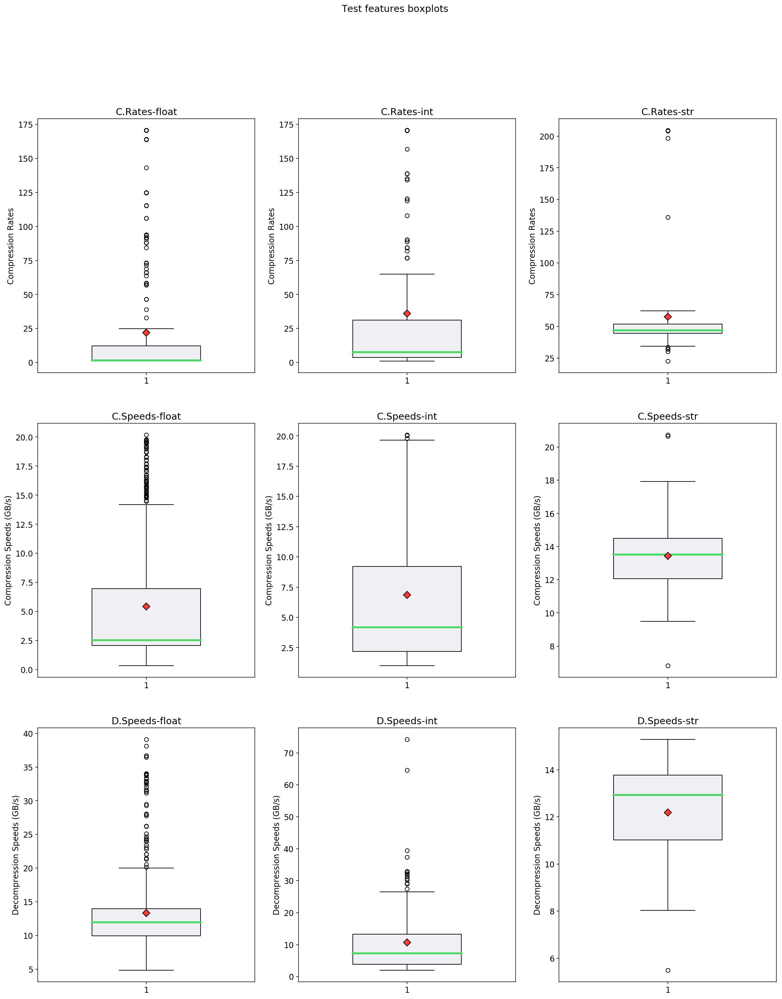

In [8]:
df_outliers = my_df[(my_df.Block_Size == 0) & (my_df.CL == 5) & (my_df.Codec == 'blosclz') & (my_df.Filter == 'noshuffle')]
cst.paint_dtype_boxplots(df_outliers)

Mostramos a continuación los datos atípicos

In [9]:
for i in range(2):
    dfaux = df_outliers[df_outliers.DType.str.contains(cst.TYPES[i])]
    if dfaux.size > 0:
        cr_lim = cst.outlier_lim(dfaux['CRate'])
        cs_lim = cst.outlier_lim(dfaux['CSpeed'])
        ds_lim = cst.outlier_lim(dfaux['DSpeed'])
        result = dfaux[(dfaux.CRate < cr_lim[0]) | (dfaux.CRate > cr_lim[1]) |
                      (dfaux.CSpeed < cs_lim[0]) | (dfaux.CSpeed > cs_lim[1]) |
                      (dfaux.DSpeed < ds_lim[0]) | (dfaux.DSpeed > ds_lim[1])][cst.ALL_FEATURES]
        if result.size > 0:
            print('%d %s OUTLIERS' % (result.shape[0], cst.TYPES[i].upper()))
            display(result)

74 FLOAT OUTLIERS


,Chunk_Size,Mean,Median,Sd,Skew,Kurt,Min,Max,Q1,Q3,N_Streaks,CRate,CSpeed,DSpeed
84244,1.475,7.835,6.866,6.404,0.414,0.209,-12.035,27.183,4.119,11.317,"13,756.000",1.000,1.739,29.472
200884,2.215,0.456,0.000,1.532,8.146,210.120,0.000,122.311,0.000,0.000,"28,860.000",2.935,3.793,38.118
202504,2.215,0.650,0.000,2.098,4.997,32.385,0.000,43.932,0.000,0.000,"29,002.000",3.036,4.552,33.353
213844,2.215,0.036,0.000,0.104,5.367,54.662,0.000,4.711,0.000,0.000,"28,858.000",2.935,4.428,39.103
215464,2.215,0.044,0.000,0.127,4.180,23.454,0.000,3.249,0.000,0.000,"29,004.000",3.036,4.566,36.434
307804,16.000,0.000,0.000,0.000,0.000,-3.000,0.000,0.000,0.000,0.000,1.000,170.639,19.775,32.900
309424,16.000,0.000,0.000,0.000,0.000,-3.000,0.000,0.000,0.000,0.000,1.000,170.639,19.447,31.660
315904,16.000,0.020,0.000,0.301,26.479,"1,032.815",0.000,36.053,0.000,0.000,"37,328.000",46.348,14.149,18.714
317524,16.000,0.000,0.000,0.000,0.000,-3.000,0.000,0.000,0.000,0.000,1.000,170.639,19.686,31.148
319144,16.000,0.000,0.000,0.000,0.000,-3.000,0.000,0.000,0.000,0.000,1.000,170.639,19.024,32.016


36 INT OUTLIERS


,Chunk_Size,Mean,Median,Sd,Skew,Kurt,Min,Max,Q1,Q3,N_Streaks,CRate,CSpeed,DSpeed
199264,2.445,0.000,0.000,0.027,99.485,"18,684.148",0.000,8.000,0.000,0.000,505.000,156.816,20.032,74.193
212224,2.445,0.002,0.000,0.055,50.616,"3,993.813",0.000,8.000,0.000,0.000,"1,523.000",134.316,19.042,22.407
231664,16.000,0.000,0.000,0.000,0.000,-3.000,0.000,0.000,0.000,0.000,1.000,170.639,19.035,29.024
251104,2.445,0.001,0.000,0.045,47.237,"3,683.632",0.000,7.000,0.000,0.000,"1,533.000",135.187,19.078,64.619
278644,16.000,0.000,0.000,0.000,0.000,-3.000,0.000,0.000,0.000,0.000,1.000,170.639,19.401,30.187
280264,16.000,0.000,0.000,0.000,0.000,-3.000,0.000,0.000,0.000,0.000,1.000,170.639,17.901,21.354
288364,16.000,0.000,0.000,0.000,0.000,-3.000,0.000,0.000,0.000,0.000,1.000,170.639,19.275,32.867
289984,16.000,0.000,0.000,0.000,0.000,-3.000,0.000,0.000,0.000,0.000,1.000,170.639,19.645,32.703
296464,16.000,0.017,0.000,0.468,41.152,"2,111.449",0.000,63.000,0.000,0.000,"7,505.000",120.436,16.952,24.435
298084,16.000,0.000,0.000,0.000,0.000,-3.000,0.000,0.000,0.000,0.000,1.000,170.639,19.581,32.834


No mostramos los datos atípicos de tipo string dado que no extraemos ninguna característica de chunk que podamos comentar, nos centraremos en ellos cuando busquemos correlaciones entre blosclz y el resto de codecs.  
En cuanto a los datos atípicos observamos que la mayoría son series números idénticos o muy parecidos, siempre con un rango intercuartílico de 0.

## Correlaciones Block Size
Aquí pretendemos observar la correlación entre el tamaño de bloque y las medidas de compresión, para ello filtramos los datos por tipo, codec, filtro, nivel de compresión y tamaño de bloque; y calculamos la media de su ratio de compresión y velocidades de compresión/decompresión.


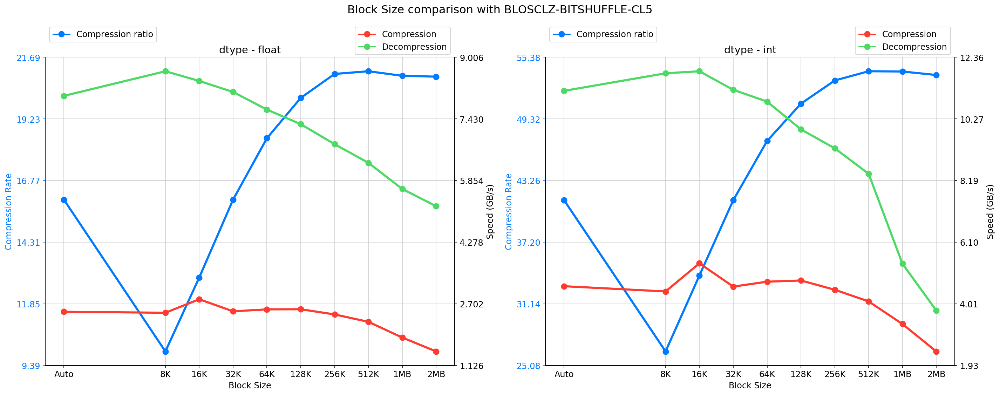

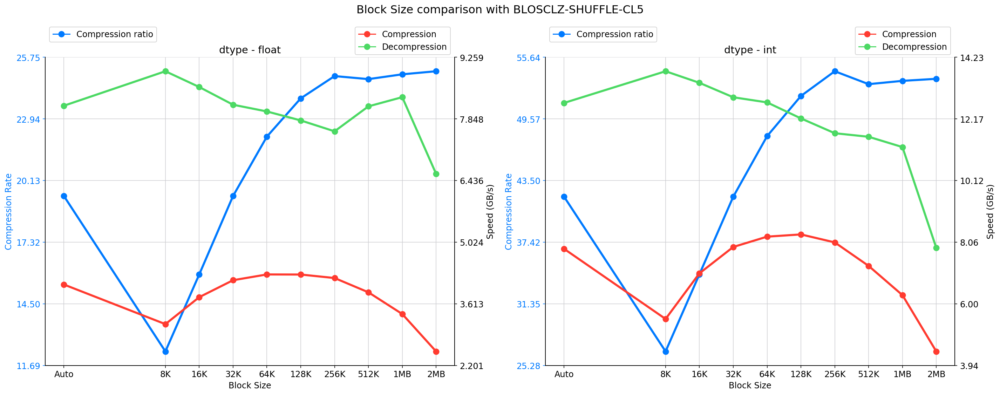

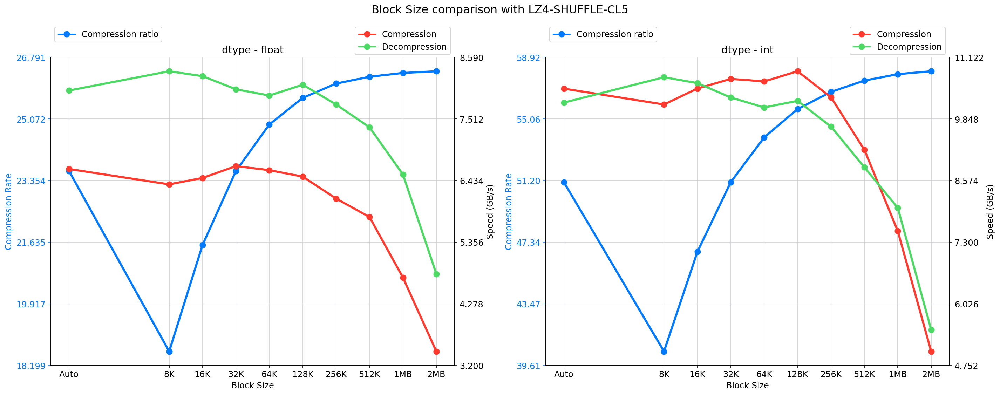

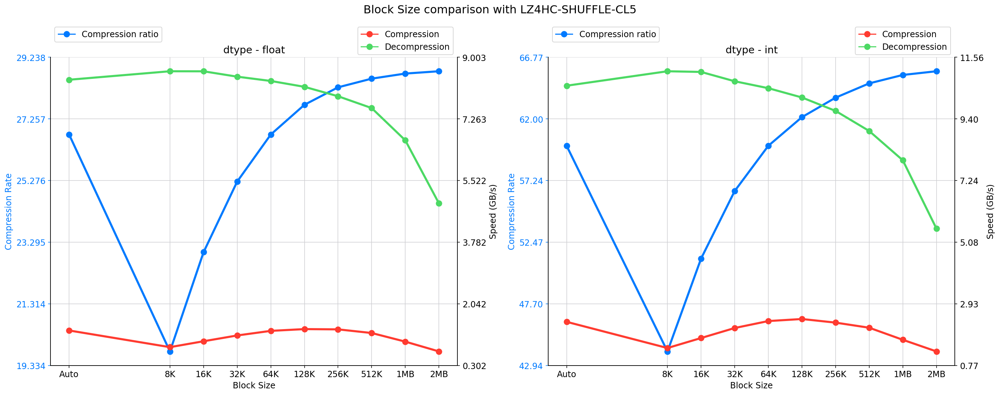

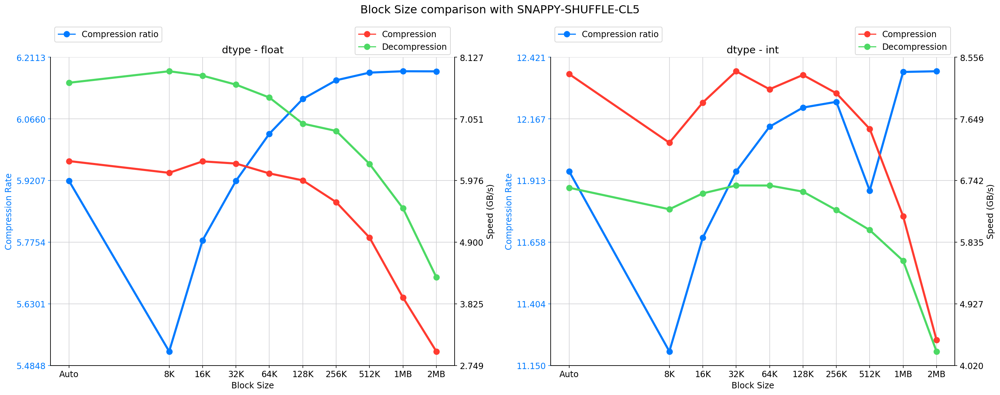

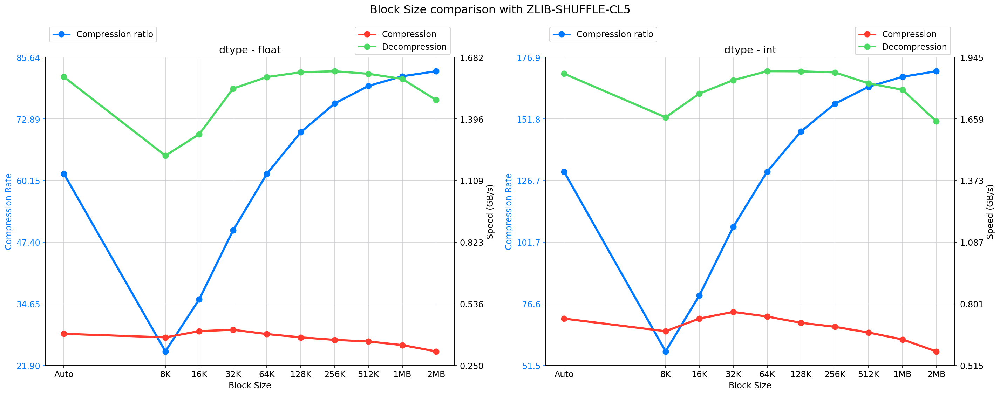

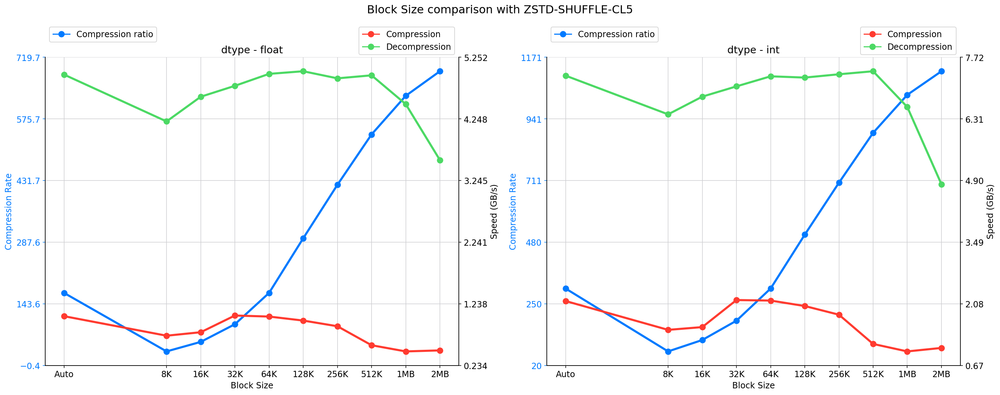

In [10]:
cst.paint_all_block_cor(my_df, 'shuffle', c_level=5)

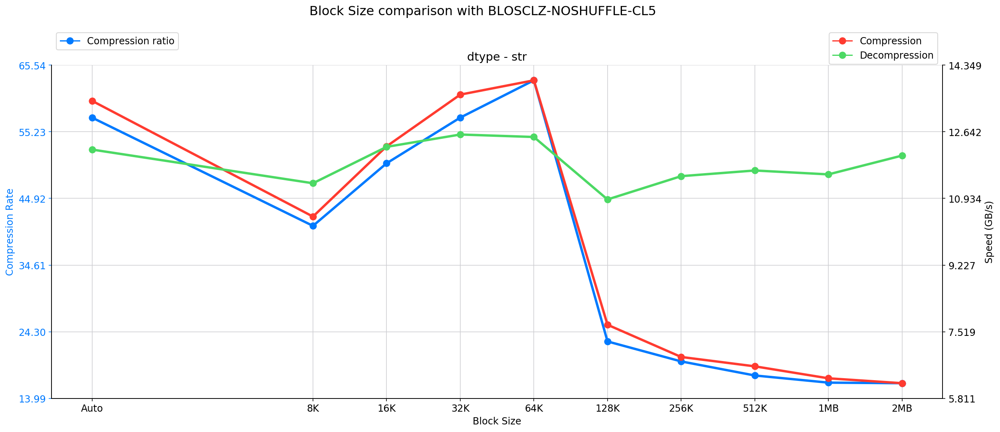

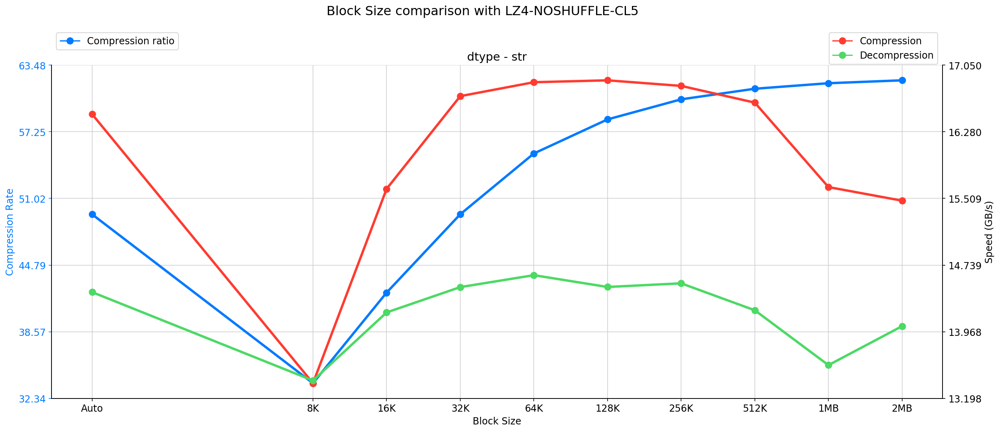

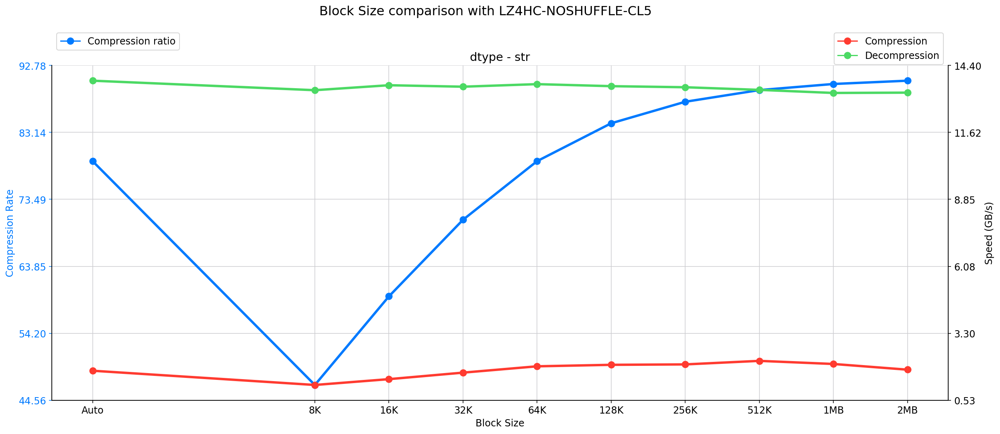

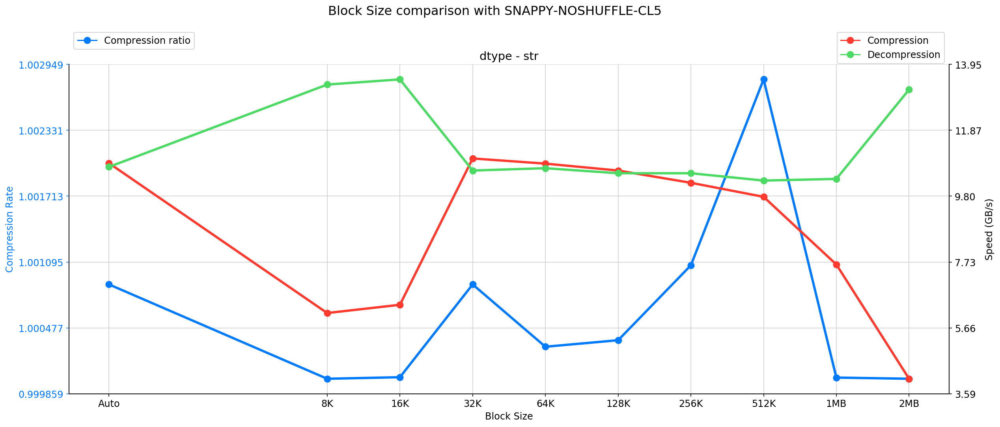

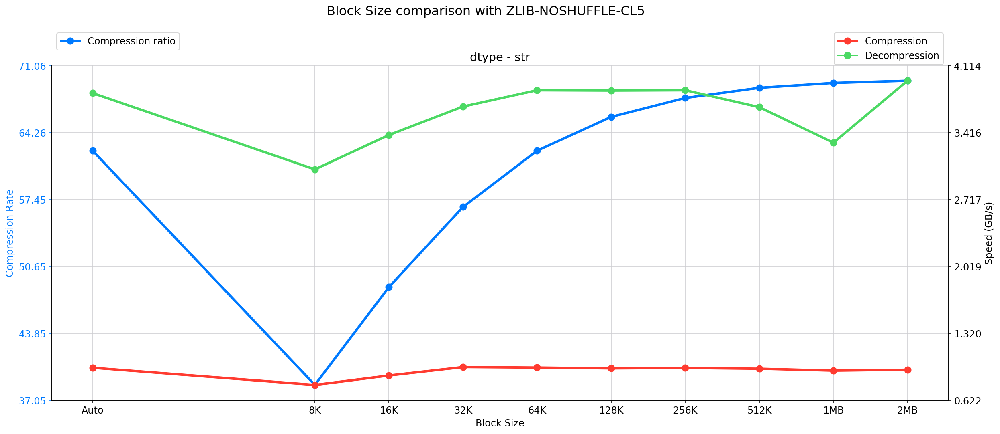

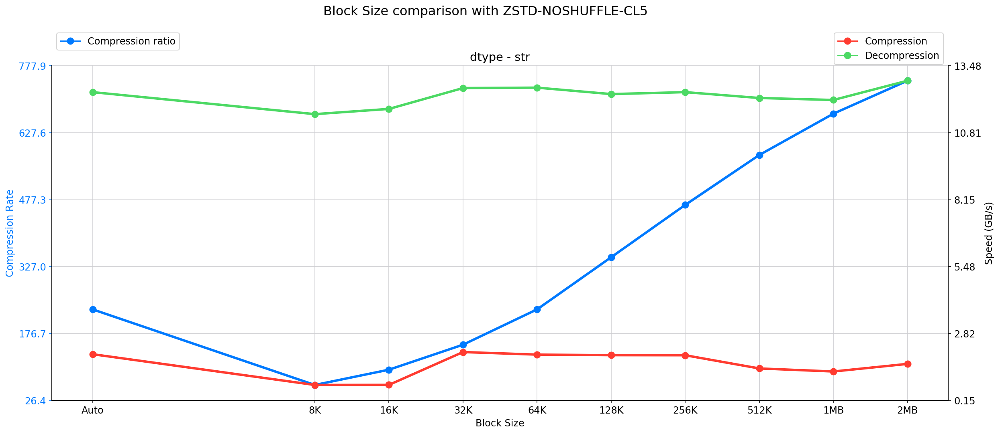

In [11]:
cst.paint_all_block_cor(my_df, 'noshuffle')

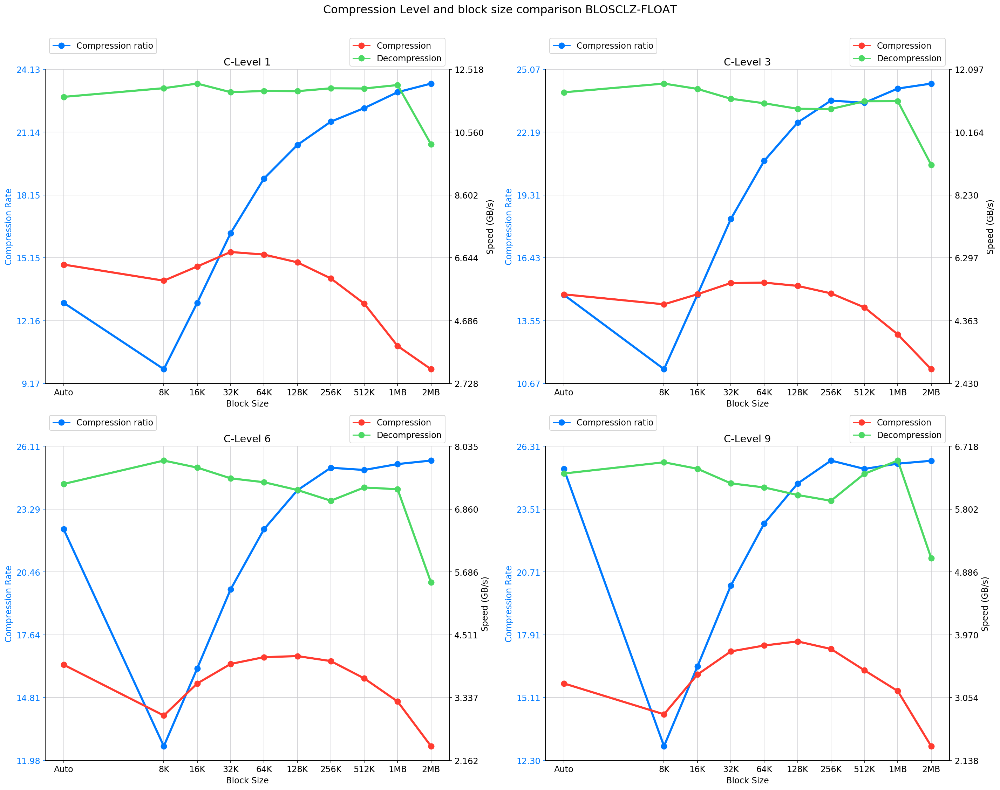

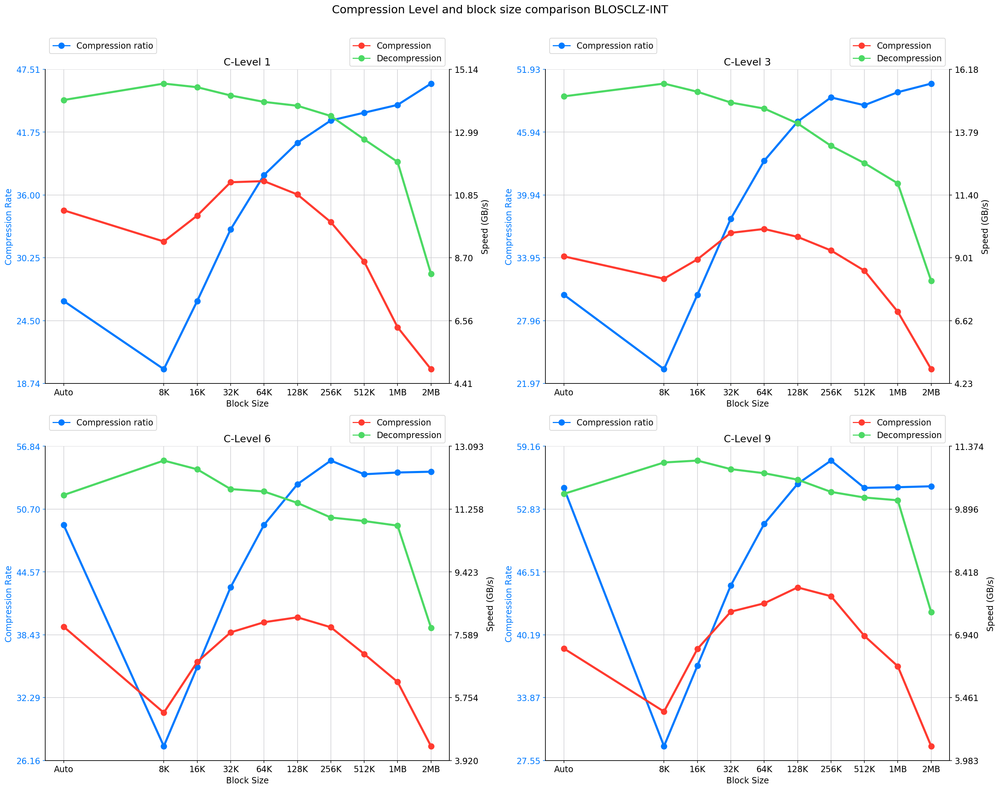

In [12]:
cst.paint_cl_comparison(my_df, 'shuffle', 'blosclz')

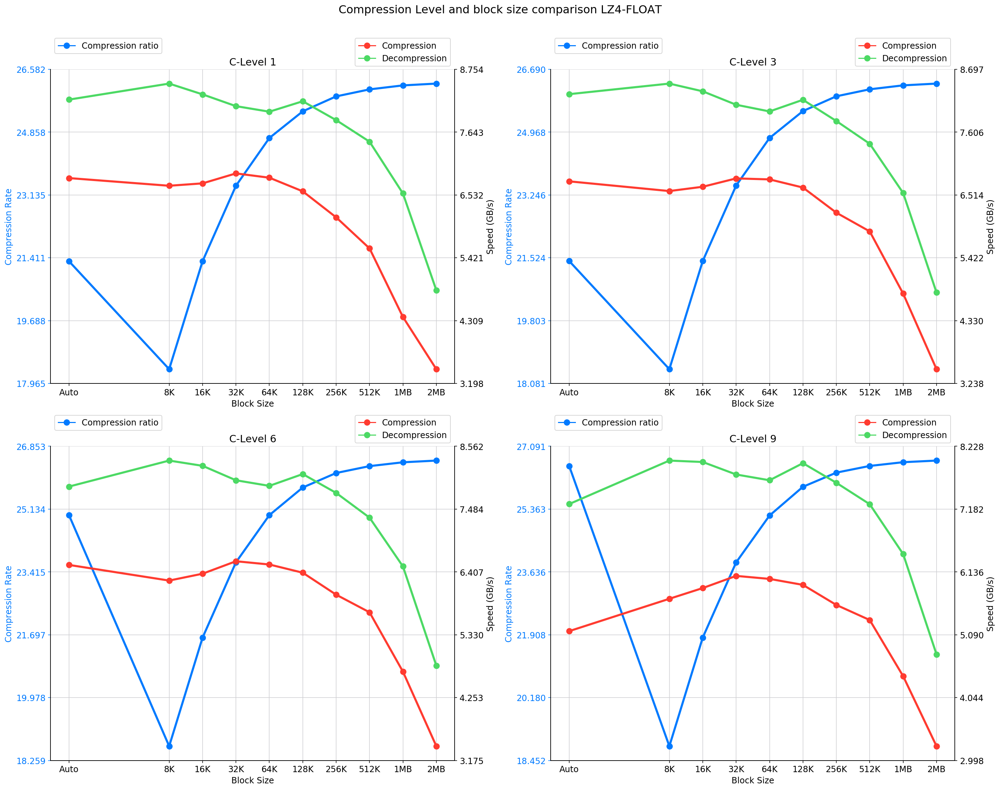

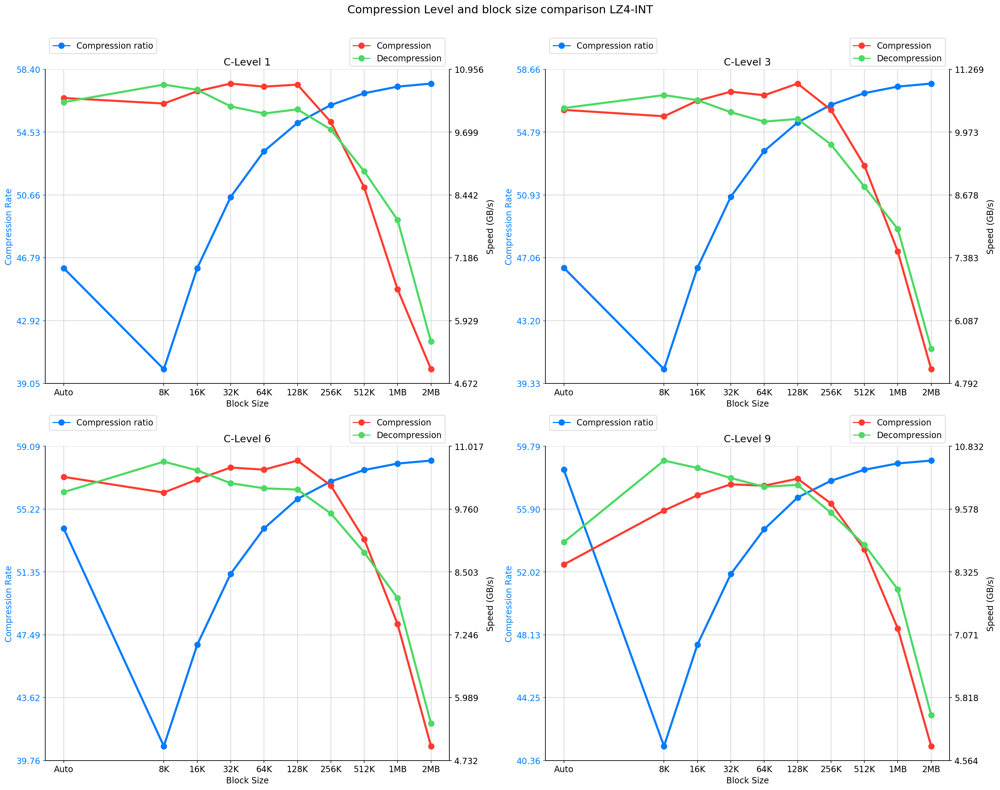

In [13]:
cst.paint_cl_comparison(my_df, 'shuffle', 'lz4')

## Comparación de niveles de compresión
Al igual que en el anterior caso hacemos los mismos gráficos pero observando el nivel de compresión.

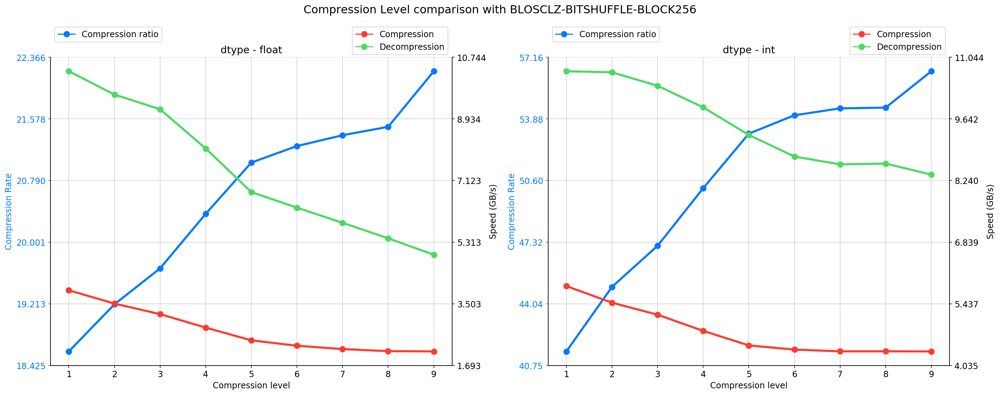

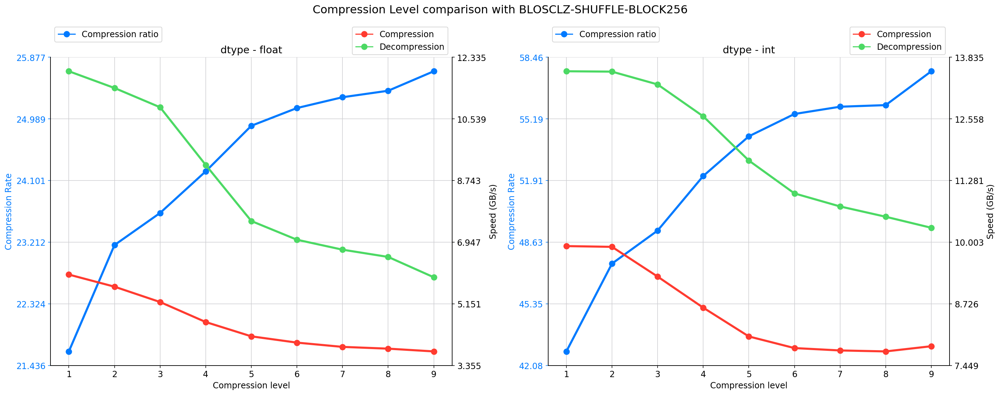

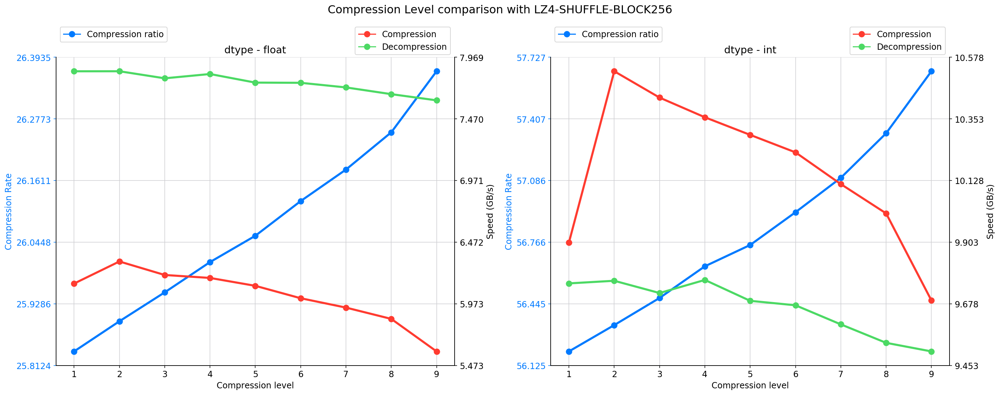

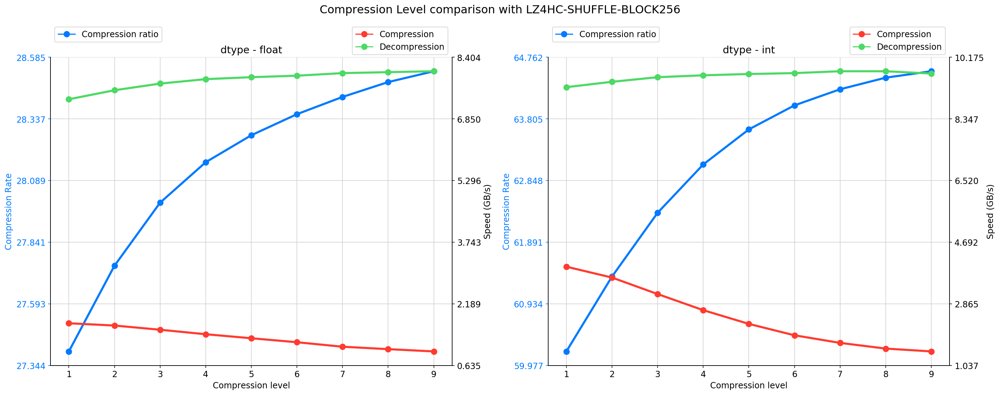

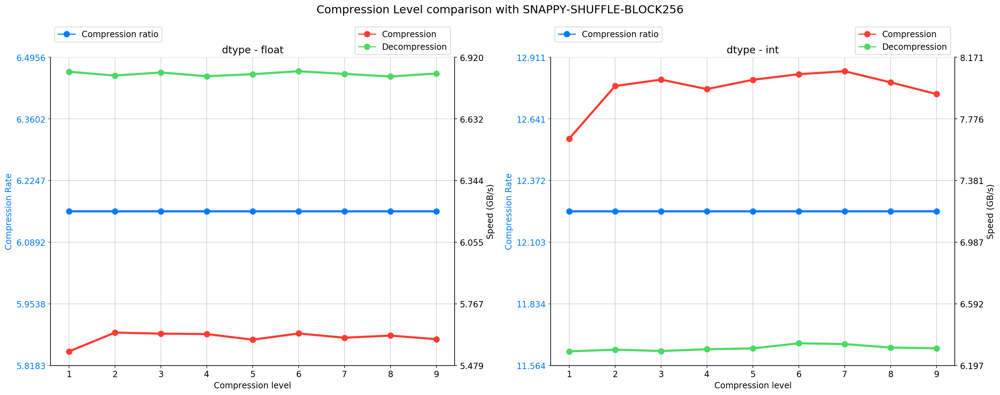

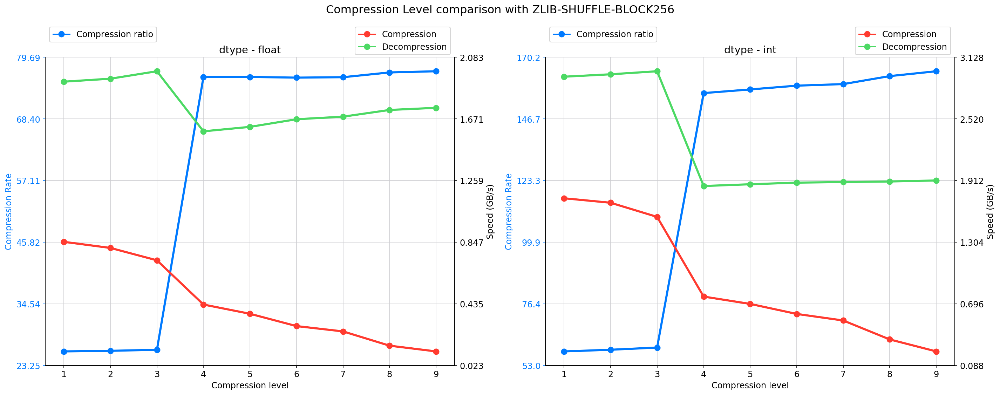

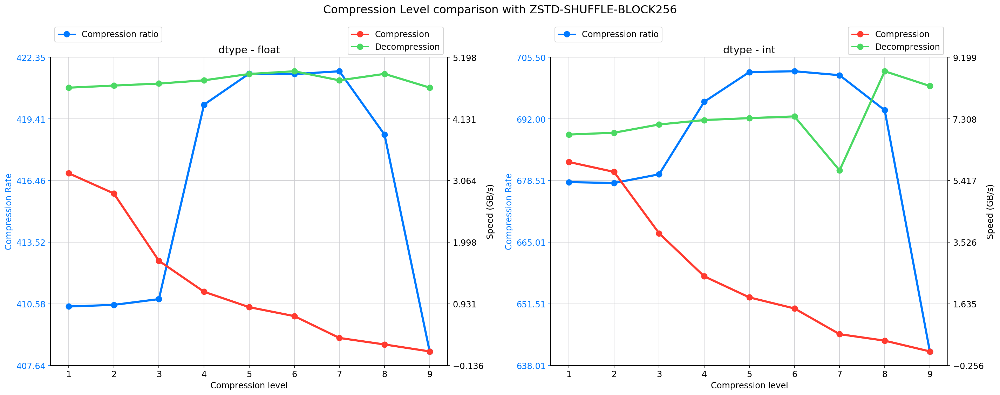

In [14]:
# BLOCK SIZE --> CL
cst.paint_all_block_cor(my_df, 'shuffle', block_size=256, cl_mode=True)

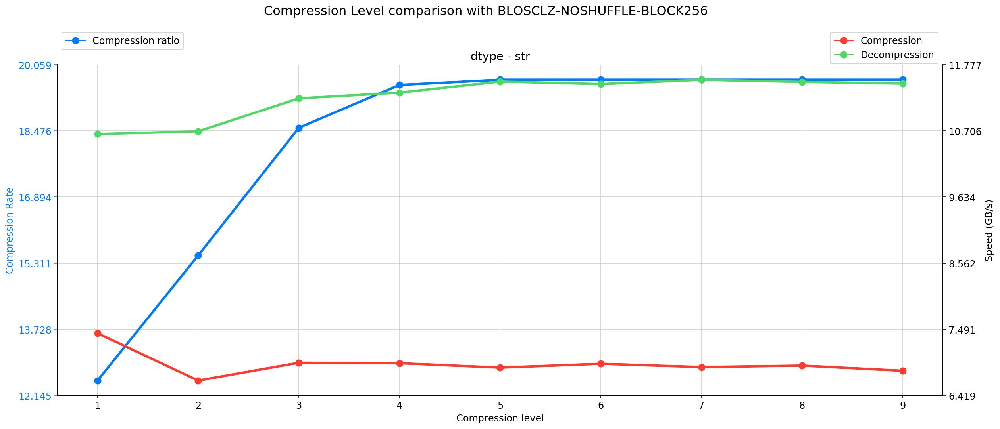

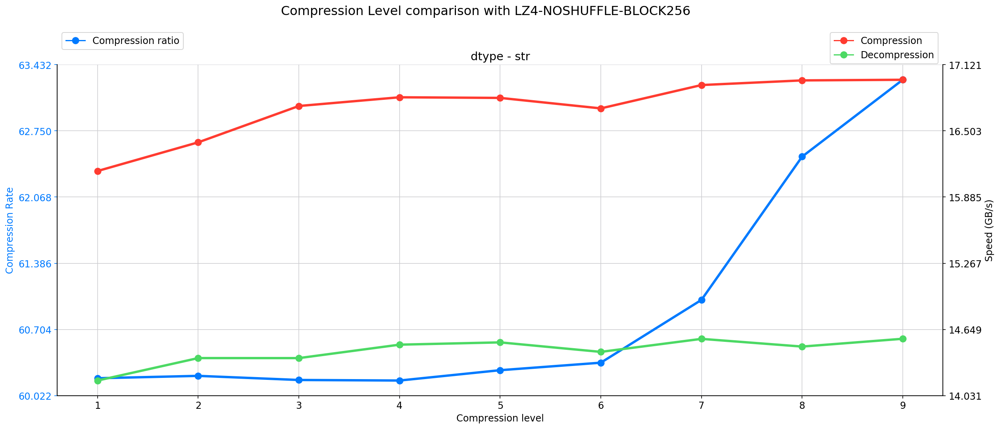

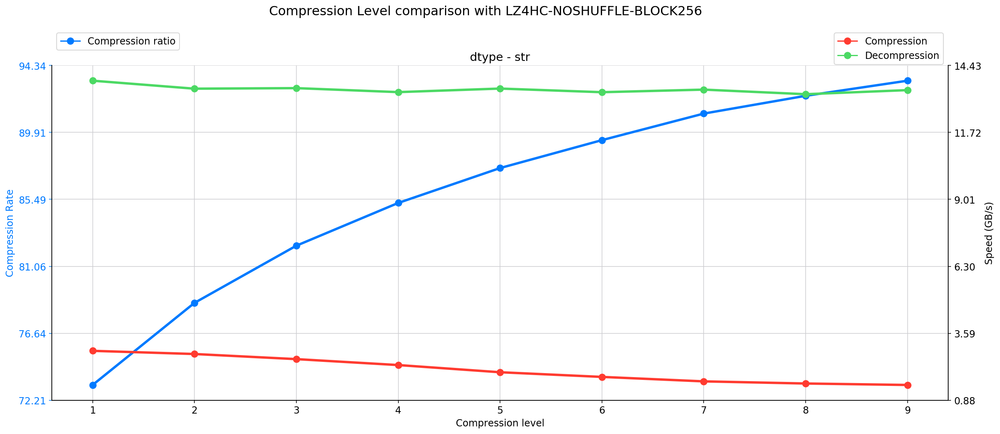

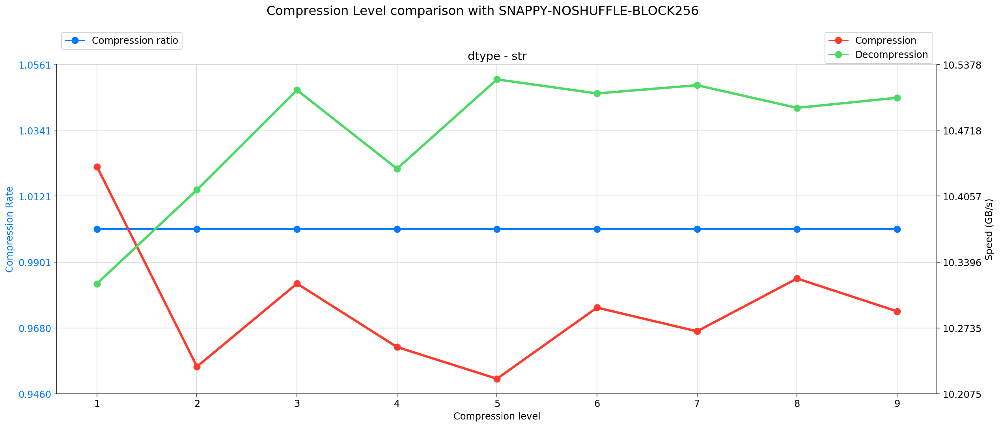

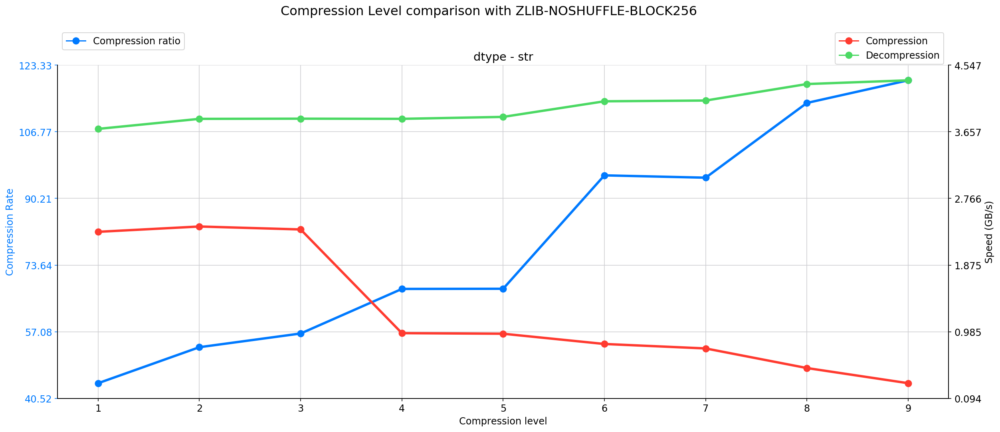

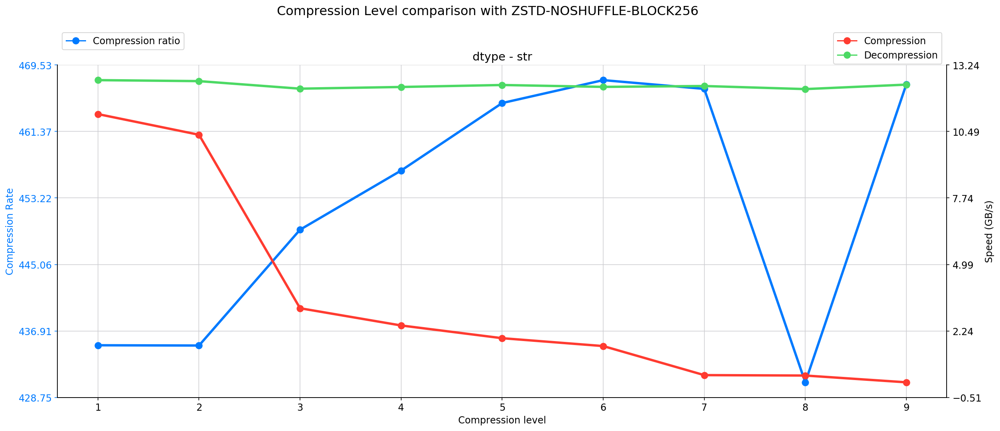

In [15]:
cst.paint_all_block_cor(my_df, 'noshuffle', block_size=256, cl_mode=True)

## Tablas columnares VS Tablas normales
En el caso de que los datos esten en forma de tabla, si la tabla contiene más de una columna se realizan dos pruebas de compresión, una guardando los datos como tabla normal, fila por fila y otra guardándolos columnarmente.

In [16]:
df_col = my_df[my_df.Table == 2]
if df_col.size > 0:
    sets = df_col.drop_duplicates(subset=['DataSet'])
    for dataset in sets['DataSet']:
        dfaux = my_df[my_df.DataSet == dataset]
        normal_table = dfaux[dfaux.Table == 1][cst.TEST_FEATURES]
        normal_table.columns = ['N_CRate', 'N_CSpeed', 'N_DSpeed']
        col_table = dfaux[dfaux.Table == 2][cst.TEST_FEATURES]
        col_table.columns = ['COL_CRate', 'COL_CSpeed', 'COL_DSpeed']
        result = pd.concat([normal_table, col_table])
        result = result[['N_CRate', 'COL_CRate', 'N_CSpeed', 'COL_CSpeed','N_DSpeed', 'COL_DSpeed']]
        print(sets[sets.DataSet == dataset][cst.DESC_SET])
        display(result.describe())

                            DataSet    DType  Table  Chunk_Size
1001160  /msft/table.values_block_0  float64  2.000      16.000


,N_CRate,COL_CRate,N_CSpeed,COL_CSpeed,N_DSpeed,COL_DSpeed
count,"9,720.000","9,720.000","9,720.000","9,720.000","9,720.000","9,720.000"
mean,10.462,17.942,2.063,2.281,5.760,4.986
std,7.310,33.079,2.237,2.462,4.037,3.204
min,1.000,1.000,0.002,0.002,0.361,0.345
25%,4.342,5.133,0.413,0.401,2.599,2.595
50%,8.844,8.050,1.249,1.557,4.425,4.276
75%,14.532,15.924,3.038,3.397,8.164,6.744
max,39.004,297.005,10.584,15.156,28.628,28.773


                            DataSet DType  Table  Chunk_Size
1025460  /msft/table.values_block_2  |S49  2.000      16.000


,N_CRate,COL_CRate,N_CSpeed,COL_CSpeed,N_DSpeed,COL_DSpeed
count,"12,960.000","12,960.000","12,960.000","12,960.000","12,960.000","12,960.000"
mean,52.373,147.258,6.509,6.845,11.466,10.729
std,45.062,737.652,5.962,6.167,3.926,3.685
min,1.000,1.000,0.005,0.007,1.862,1.881
25%,7.624,21.154,1.176,1.012,10.437,9.548
50%,46.981,47.146,4.621,5.745,12.911,11.920
75%,72.699,86.410,11.163,11.211,13.708,13.126
max,234.129,"10,131.164",20.215,22.567,34.169,30.888


## Correlaciones Blosclz-CL1 VS Otros
Para poder visualizar todas estas correlaciones calculamos directamente el coeficiente de pearson y su p-valor asociado entre los datos de blosclz con nivel de compresión 1 y el resto.

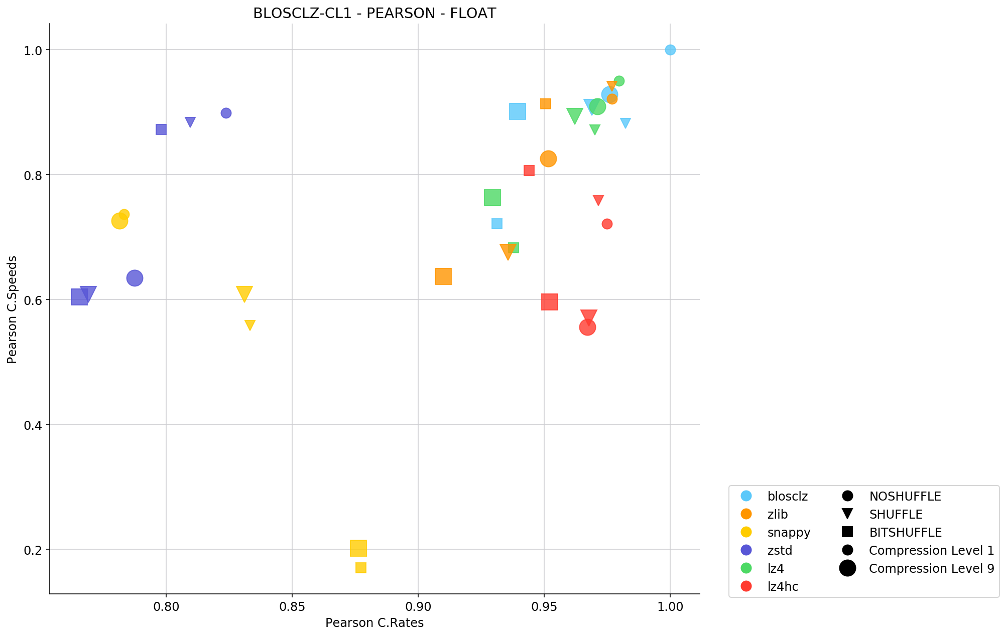

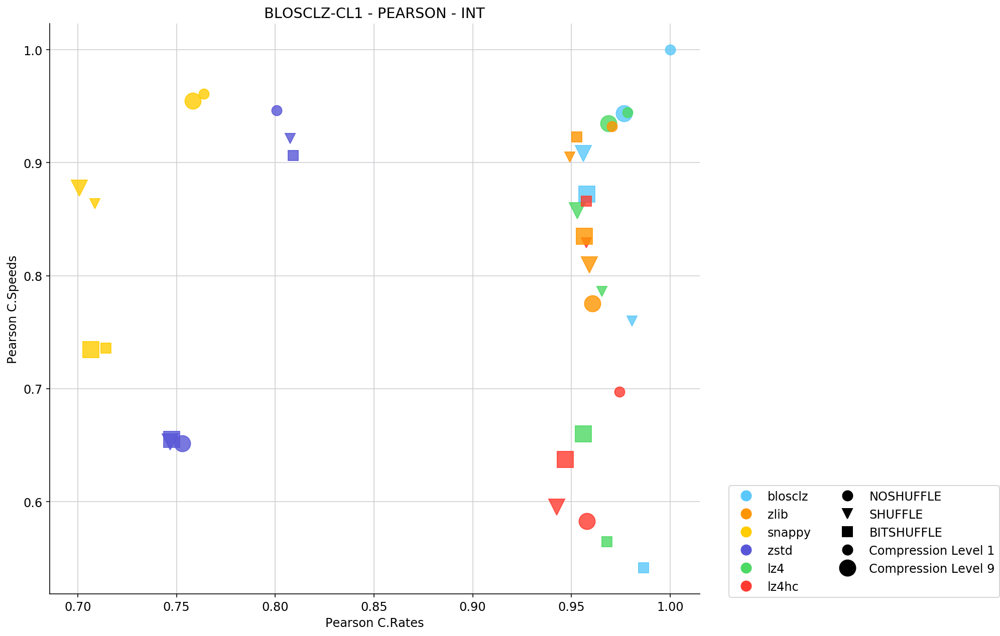

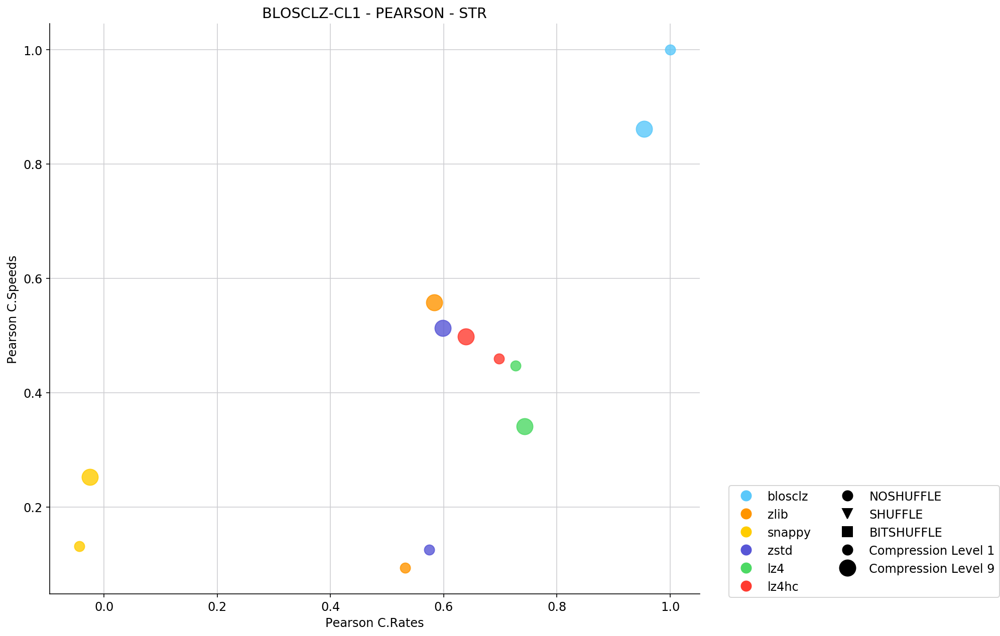

In [17]:
cst.paint_codec_pearson_corr(my_df, 'blosclz', 1)

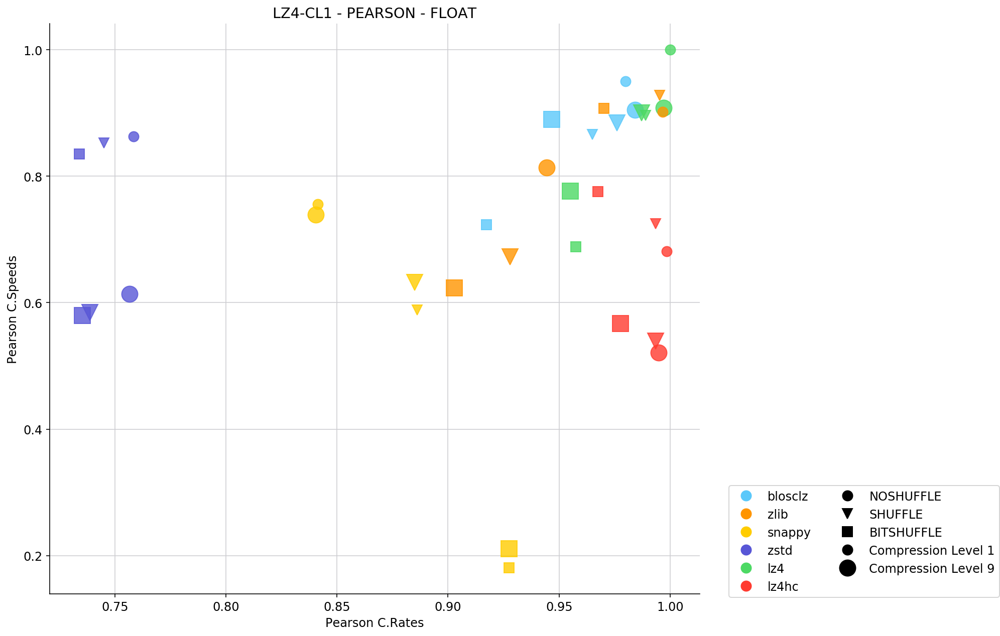

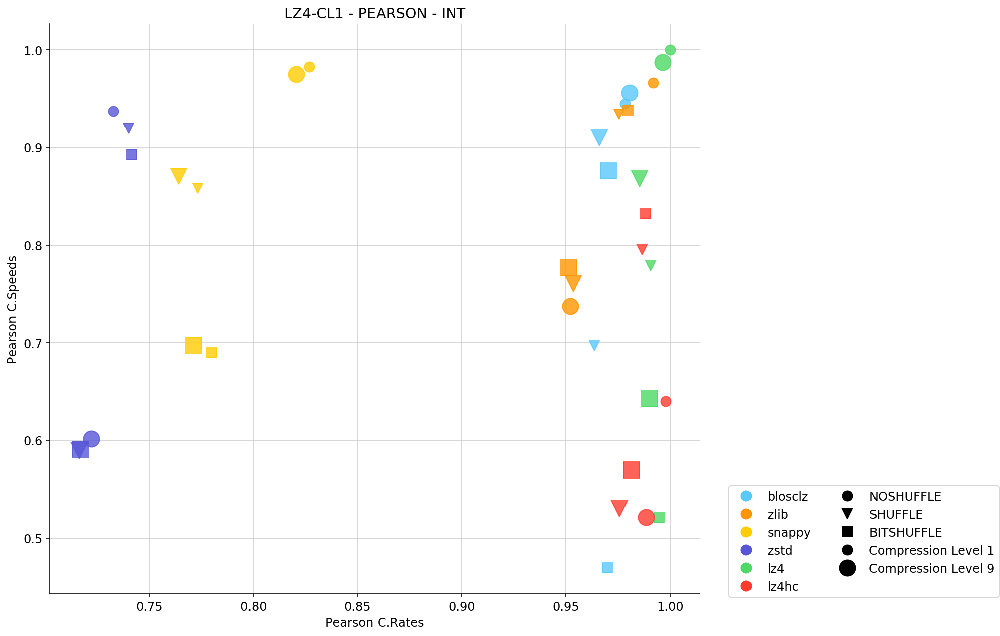

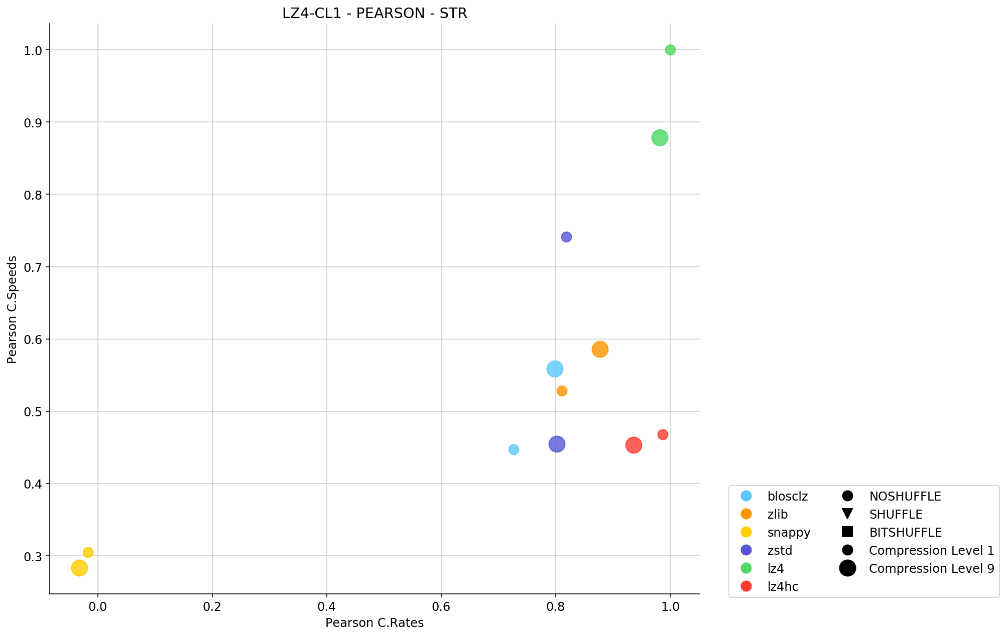

In [18]:
cst.paint_codec_pearson_corr(my_df, 'lz4', 1)

625 points


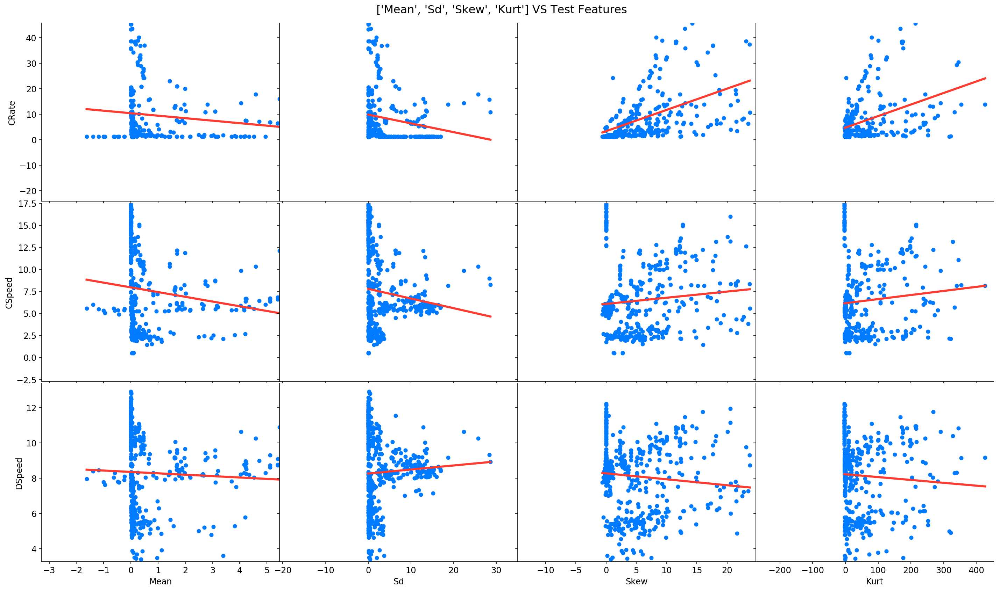

In [19]:
dfaux = my_df[(my_df.Codec == 'lz4') & (my_df.Block_Size == 256) & (my_df.Filter == 'shuffle') &
              (my_df.CL == 5) & (my_df.DType.str.contains('float') | my_df.DType.str.contains('int'))]
cols = ['Mean', 'Sd', 'Skew', 'Kurt']
cst.custom_pairs(dfaux, cols)

625 points


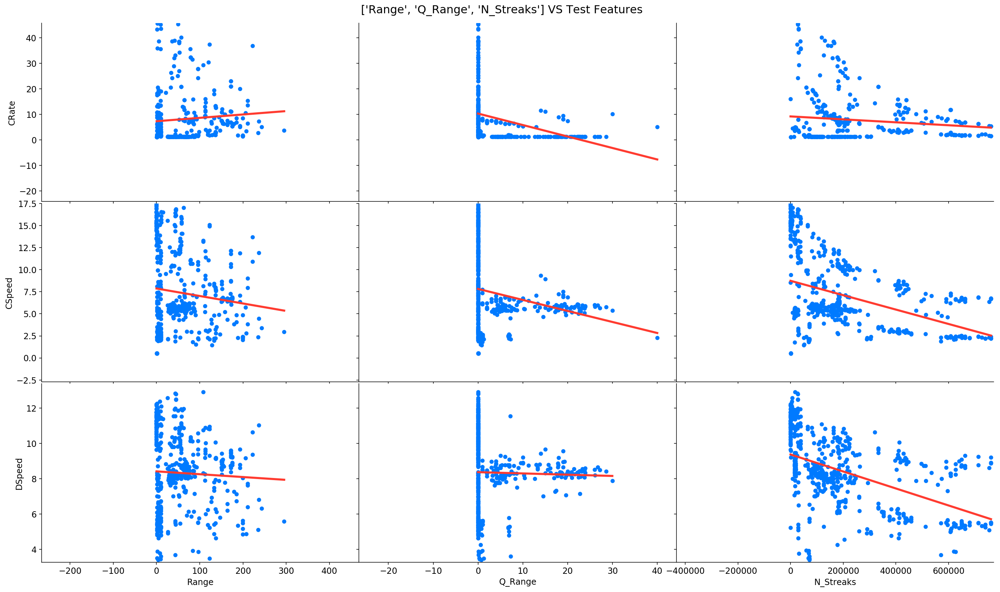

In [20]:
cols = ['Range', 'Q_Range', 'N_Streaks']
dfaux = dfaux.assign(Range=dfaux['Max'] - dfaux['Min'])
dfaux = dfaux.assign(Q_Range=dfaux['Q3'] - dfaux['Q1'])
cst.custom_pairs(dfaux, cols)